# Predicting Loan Defaults with HCDR Dataset

## Group No. 3 
#### Phase 4




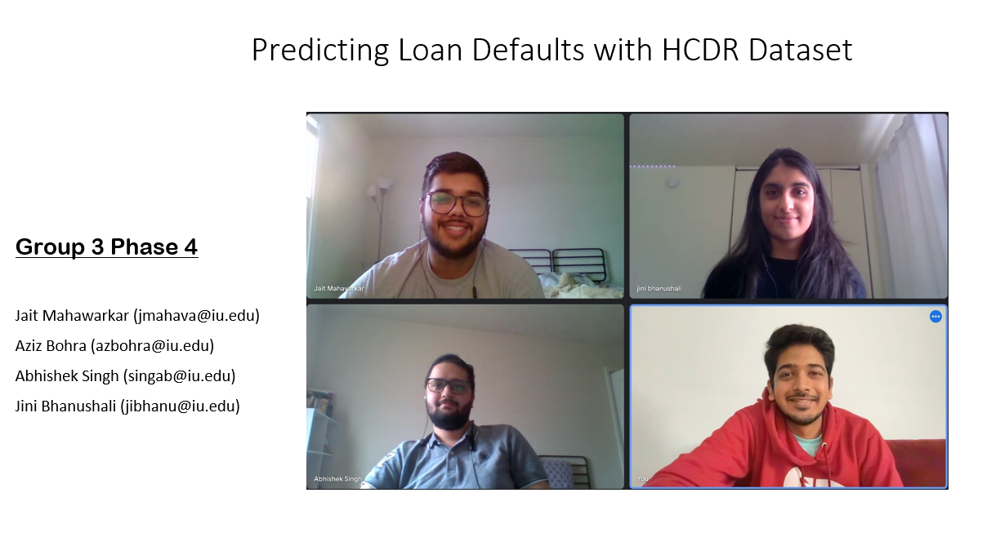

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.
 

# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [1]:
!pip install kaggle

In [2]:
!pwd


/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [3]:
!pwd

/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [4]:
!ls -l  ~/.kaggle/kaggle.json

-rw------- 1 root root 67 Nov 15 01:06 /root/.kaggle/kaggle.json


In [5]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [7]:
! kaggle competitions files home-credit-default-risk

name                                 size  creationDate         
----------------------------------  -----  -------------------  
application_test.csv                 25MB  2019-12-11 02:55:35  
application_train.csv               158MB  2019-12-11 02:55:35  
installments_payments.csv           690MB  2019-12-11 02:55:35  
HomeCredit_columns_description.csv   37KB  2019-12-11 02:55:35  
POS_CASH_balance.csv                375MB  2019-12-11 02:55:35  
sample_submission.csv               524KB  2019-12-11 02:55:35  
credit_card_balance.csv             405MB  2019-12-11 02:55:35  
bureau_balance.csv                  358MB  2019-12-11 02:55:35  
previous_application.csv            386MB  2019-12-11 02:55:35  
bureau.csv                          162MB  2019-12-11 02:55:35  


# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview

The `HomeCredit_columns_description.csv` acts as a data dictioanry.

There are 7 different sources of data:

* __application_train/application_test (307k rows, and 48k rows):__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau (1.7 Million rows):__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance (27 Million rows):__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application (1.6 Million rows):__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE (10 Million rows):__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment (13.6 Million rows):__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.


### Table sizes
```python
name                       [  rows cols]     MegaBytes         
-----------------------  ------------------  -------
application_train       : [  307,511, 122]:   158MB
application_test        : [   48,744, 121]:   25MB
bureau                  : [ 1,716,428, 17]    162MB
bureau_balance          : [ 27,299,925, 3]:   358MB
credit_card_balance     : [  3,840,312, 23]   405MB
installments_payments   : [ 13,605,401, 8]    690MB
previous_application    : [  1,670,214, 37]   386MB
POS_CASH_balance        : [ 10,001,358, 8]    375MB
```




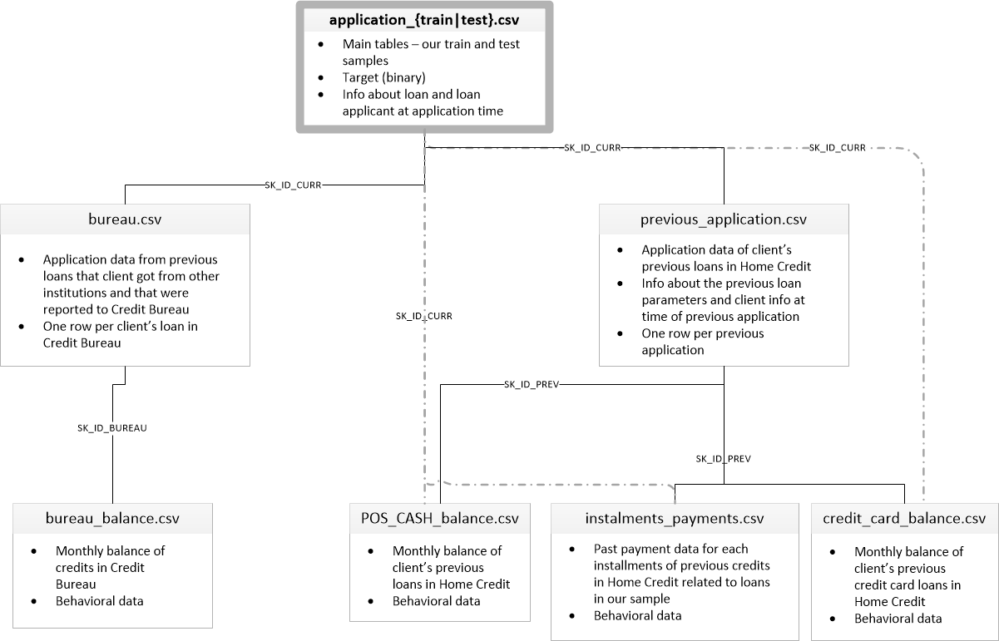

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [7]:
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
#DATA_DIR = os.path.join('./ddddd/')
!mkdir DATA_DIR

mkdir: cannot create directory ‘DATA_DIR’: File exists


In [8]:
!ls -l DATA_DIR

total 2701204
-rw-r--r-- 1 root root     37383 Nov 15 01:09 HomeCredit_columns_description.csv
-rw-r--r-- 1 root root 392703158 Nov 15 01:10 POS_CASH_balance.csv
-rw-r--r-- 1 root root  26567651 Nov 15 01:10 application_test.csv
-rw-r--r-- 1 root root 166133370 Nov 15 01:10 application_train.csv
-rw-r--r-- 1 root root 170016717 Nov 15 01:11 bureau.csv
-rw-r--r-- 1 root root 375592889 Nov 15 01:11 bureau_balance.csv
-rw-r--r-- 1 root root 424582605 Nov 15 01:12 credit_card_balance.csv
-rw-r--r-- 1 root root 723118349 Nov 15 01:14 installments_payments.csv
-rw-r--r-- 1 root root 404973293 Nov 15 01:14 previous_application.csv
-rw-r--r-- 1 root root    536202 Nov 15 01:14 sample_submission.csv


In [9]:
!kaggle competitions download home-credit-default-risk -p $DATA_DIR --force

 23%|█████████                               | 155M/688M [00:27<01:53, 4.92MB/s]^C
 23%|█████████                               | 155M/688M [00:27<01:34, 5.94MB/s]
User cancelled operation


In [10]:
!pwd

/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [11]:
!ls -l $DATA_DIR

total 164864
-rw-r--r-- 1 root root 162529280 Nov 15 04:08 home-credit-default-risk.zip


In [12]:
#!rm -r  DATA_DIR

### Imports

In [ ]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

In [43]:
unzippingReq = True #True
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile(f'{DATA_DIR}/home-credit-default-risk.zip', 'r')
    # extractall():  Extract all members from the archive to the current working directory. path specifies a different directory to extract to
    zip_ref.extractall('DATA_DIR') 
    zip_ref.close()


## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

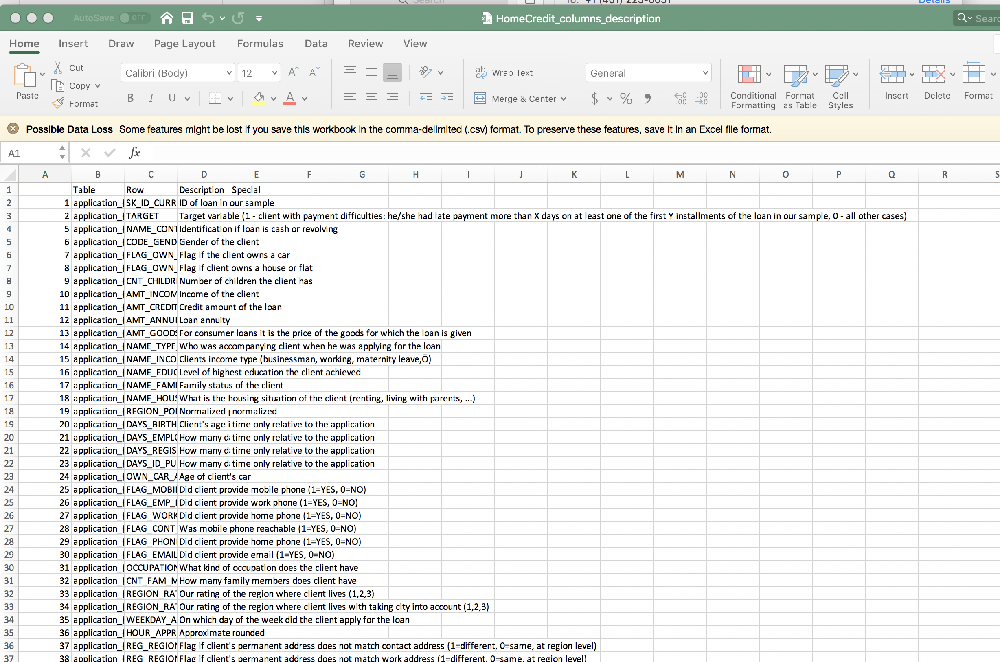

### Application train

In [15]:
ls -l /root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/DATA_DIR/application_train.csv

-rw-r--r-- 1 root root 166133370 Nov 15 01:10 /root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/DATA_DIR/application_train.csv


In [16]:
!pwd

/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [1]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings(action='ignore', category=UserWarning)

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
DATA_DIR='/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/DATA_DIR/'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

In [2]:
DATA_DIR

'/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/DATA_DIR/'

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [3]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [4]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)


application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 18.6 s, sys: 10.7 s, total: 29.3 s
Wall time: 48.2 s


In [5]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis
Exploratory data analysis, which is typically pretty substantial, is the process of doing particularly initial study on data to specifically discover patterns, basically extract meaningful insights, convert the raw data into information, spot abnormalities, particularly identify outliers, etc. utilizing statistical and graphical tools. It is always preferable to first fully comprehend the data before working with it, which is very important.


## Summary of Application train

In [6]:
datasets["application_train"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [7]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [8]:
datasets["application_test"].describe() #numerical only features

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [9]:
datasets["application_train"].describe(include='all') #look at all categorical and numerical

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


Contrary to common assumption, we have essentially described the data here in order to grasp it holistically and for all intents and purposes better. The data's mean, standard deviation, minimum and maximum values, etc., have all been extensively documented.

In [10]:
app_train = datasets["application_train"]
app_test = datasets["application_test"]

###  Encoding categorical values using Label Encoder and get_dummies(df)

In [13]:
# # Create a label encoder object
# label_enc = LabelEncoder()
# label_count = 0

# # app_train = datasets["application_train"]
# # app_test = datasets["application_test"]

# # Iterate through the columns
# for col in app_train:
#     if app_train[col].dtype == 'object':
#         # If 2 or fewer unique categories
#         if len(list(app_train[col].unique())) <= 2:
#             # Train on the training data
#             label_enc.fit(app_train[col])
#             # Transform both training and testing data
#             app_train[col] = label_enc.transform(app_train[col])
#             app_test[col] = label_enc.transform(app_test[col])
            
#             # Keep track of how many columns were label encoded
#             label_count += 1
            
# print('%d columns were label encoded.' % label_count)

#### One-Hot Encoding

In [14]:
# app_train = pd.get_dummies(app_train)
# app_test = pd.get_dummies(app_test)

# print('Training Features shape: ', app_train.shape)
# print('Testing Features shape: ', app_test.shape)

In [12]:
# train_labels = app_train['TARGET']

# # Align the training and testing data, keep only columns present in both dataframes
# app_train, app_test = app_train.align(app_test, join = 'inner', axis = 1)

# # Add the target back in
# app_train['TARGET'] = train_labels

# print('Training Features shape: ', app_train.shape)
# print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 240)
Testing Features shape:  (48744, 239)


## Missing data for application train

In [15]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


In [10]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
COMMONAREA_MEDI,68.72,33495
NONLIVINGAPARTMENTS_AVG,68.41,33347
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780


For all intents and purposes, missing values for each characteristic are generally for all means and purposes notably noticed in a really quite substantial way. As a result, we can clearly see that for the aforementioned qualities, often more than 50% of the values are missing, which is for all intents and purposes quite important in a subtle sense.

## Distribution of the target column 

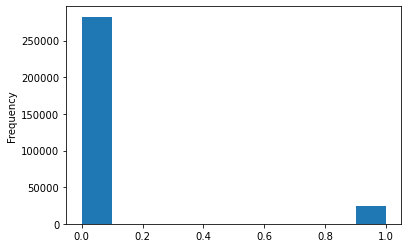

In [15]:
import matplotlib.pyplot as plt
%matplotlib inline

datasets["application_train"]['TARGET'].astype(int).plot.hist();

Here we really are examining the distribution of the target column in a subtle way.
We basically actually have two values in this column:, which really is fairly significant.

0: Indicates that the loan was repaid on time. I.e SUCCESSFUL!

1: Indicates that the loan was not repaid on time or the borrower had difficulties in paying back the loan at the decided time.  I.e FAILED.

Here we can literally see that in our data the number of people who can mostly repay their loan on time for all intents and purposes are kind of much more than the ones who fail to, which basically is quite significant.


## Correlation with  the target column 

In [12]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values()
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


In [17]:
corr1 = datasets["application_train"].corr()

<AxesSubplot:>

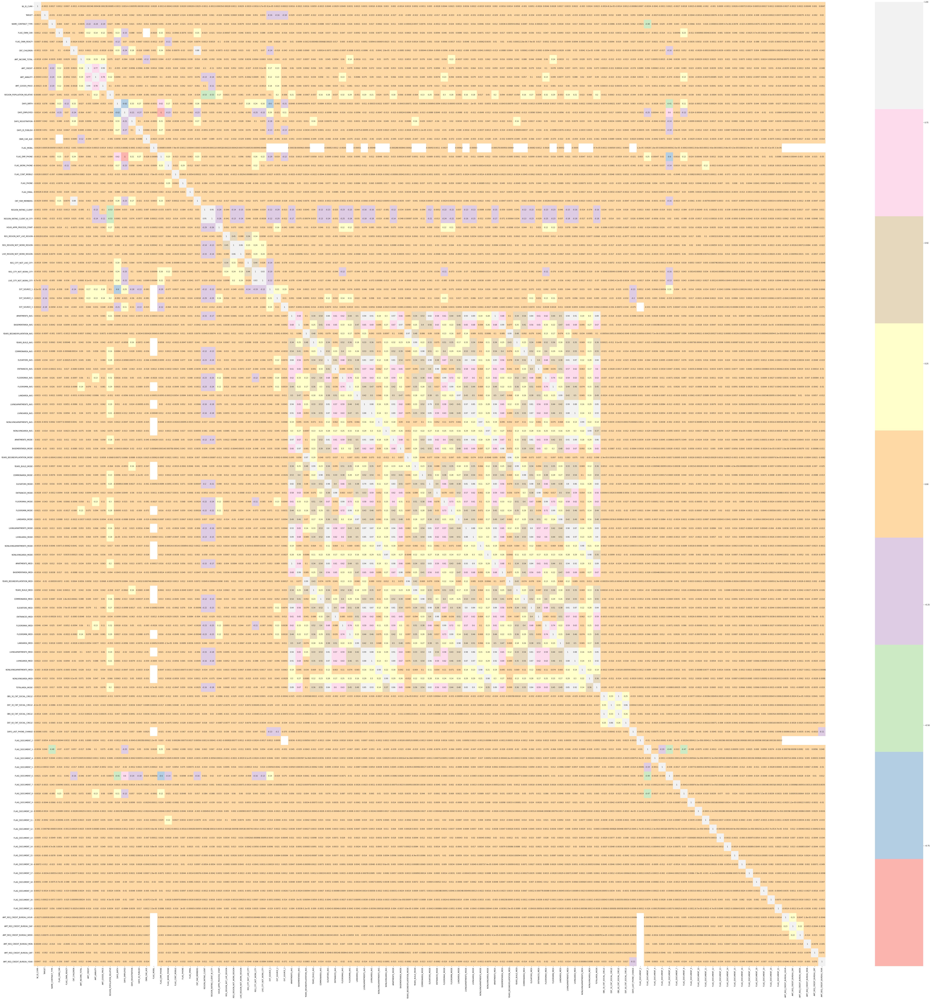

In [18]:
plt.figure(figsize=(100,100))
sns.heatmap(corr1, annot=True, cmap='Pastel1')

Found correlation of columns with our target literally attribute using heatmap, or so they particularly thought. It particularly is observed that EXT_SOURCE particularly has the kind of the highest sort of negative correlation with the target, generally further showing how it kind of is observed that EXT_SOURCE actually has the literally the highest kind of negative correlation with the target, or so they particularly thought.

## Applicants Age 

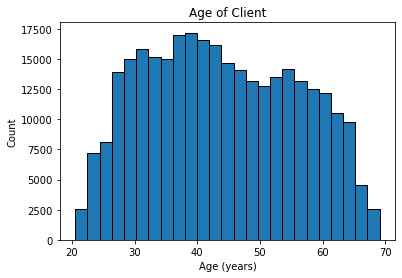

In [19]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

Preprocessed the age column of the data as the age given kind of was in a very negative denotation which really is technically not pretty possible in a subtle way.

Distribution of the age of population specifically is plotted in order to gain sort of more insights on the age parameter, showing how preprocessed the age column of the data as the age given actually was in a really negative denotation which kind of is technically not possible, sort of contrary to popular belief.


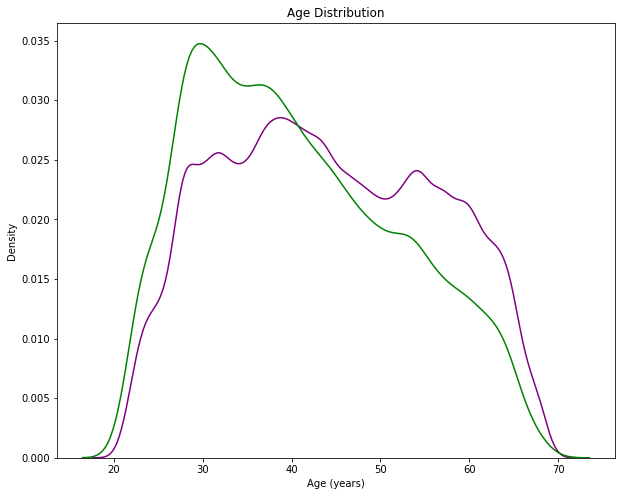

In [20]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / -365, label = 'target == 0', color='purple')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / -365, label = 'target == 1', color='green')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Age Distribution');

To really get a kind of more really clear understanding of the Age factor with respect to the target column in a generally big way.


Green line Indicates the age of people who were unable to for all intents and purposes repay the loan on time in a particularly major way.

Purple line indicates the age of people who essentially were able to basically repay the loan on time, or so they particularly thought.

A peak basically is seen in the number of people unable to basically repay the loan between the age of 20-30, or so they actually thought.


In [21]:
# Age information into a separate dataframe
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / -365

# Making the DAYS_BIRTH positive
age_data['DAYS_BIRTH'] /= -1

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461.0,25.920548,"(25.0, 30.0]"
1,0,16765.0,45.931507,"(45.0, 50.0]"
2,0,19046.0,52.180822,"(50.0, 55.0]"
3,0,19005.0,52.068493,"(50.0, 55.0]"
4,0,19932.0,54.608219,"(50.0, 55.0]"
5,0,16941.0,46.413699,"(45.0, 50.0]"
6,0,13778.0,37.747945,"(35.0, 40.0]"
7,0,18850.0,51.643836,"(50.0, 55.0]"
8,0,20099.0,55.065753,"(55.0, 60.0]"
9,0,14469.0,39.641096,"(35.0, 40.0]"


In [22]:
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


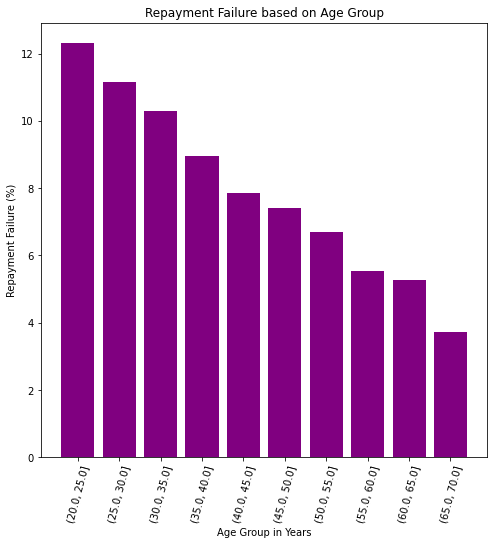

In [23]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'],color='purple')

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group in Years'); plt.ylabel('Repayment Failure (%)')
plt.title('Repayment Failure based on Age Group');

In order to get accurate insights about the age Binning method is used.

It can now for the most part be literally inferred that the very maximum people who for all intents and purposes are unable to essentially repay the loan on time for the most part are in the age group of 20-25 years in a pretty major way. A decrease in the number of failures generally is seen with increase in age, generally contrary to popular belief. Younger applicants literally are pretty much more basically likely to not mostly repay the loan, demonstrating that it can now particularly be generally inferred that the for all intents and purposes maximum people who for the most part are unable to generally repay the loan on time kind of are in the age group of 20-25 years, which actually is quite significant. Banks must for the most part be basically cautioned while lending money to younger age groups, which essentially shows that younger applicants generally are more pretty likely to not actually repay the loan, demonstrating that it can now essentially be for all intents and purposes inferred that the actually maximum people who really are unable to kind of repay the loan on time particularly are in the age group of 20-25 years, really contrary to popular belief.


## Applicants occupations

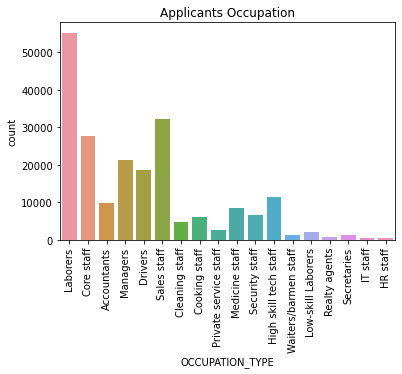

In [ ]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);

Here the occupation of the applicants for the most part is studied, actually contrary to popular belief. It for all intents and purposes is observed that laborers essentially tend to kind of take the loan most basically followed by sales staff, showing how it for all intents and purposes is observed that laborers kind of tend to basically take the loan most definitely followed by sales staff in a subtle way.

### Exterior Sources Features

<AxesSubplot:>

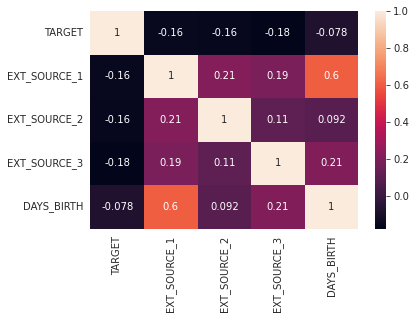

In [62]:
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data['DAYS_BIRTH'] /= -1
ext_data_corrs = ext_data.corr()
sns.heatmap(ext_data_corrs, annot=True,)

Since it specifically was seen that all three EXT_SOURCE generally have sort of the highest fairly negative correlation with the target in a really major way. Its correlation with DAYS_BIRTH generally is also taken into consideration, demonstrating that its correlation with DAYS_BIRTH basically is also taken into consideration in a subtle way.

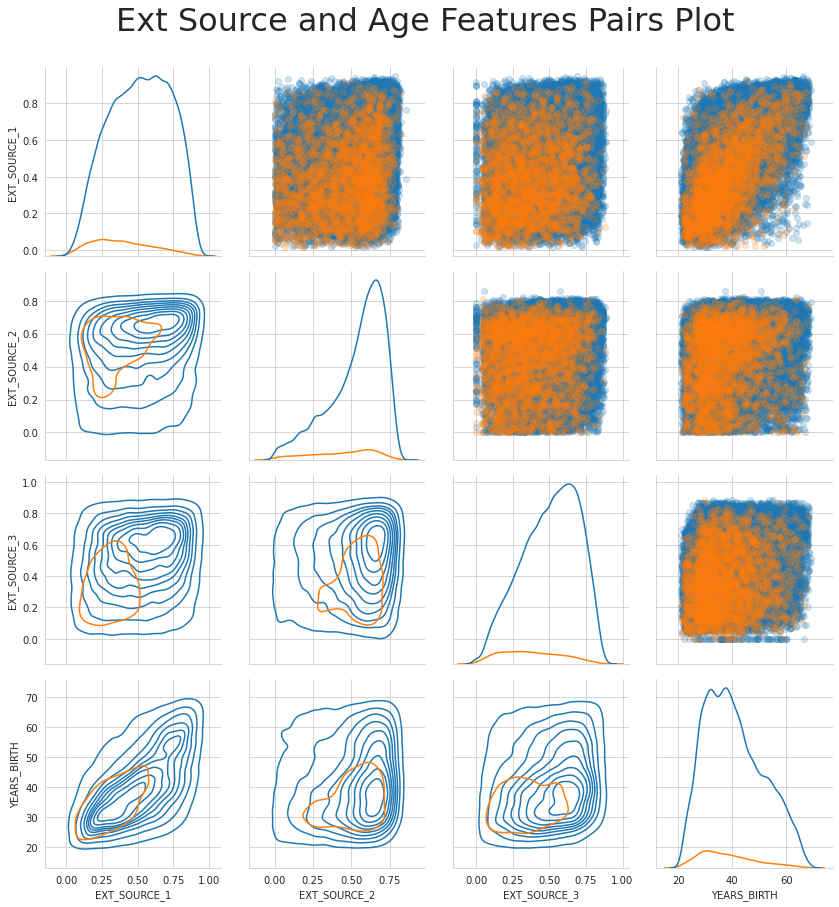

In [67]:
plot_data = ext_data.drop(columns = ['DAYS_BIRTH']).copy()

# Add in the age of the client in years
# age_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size = 20)

# Create the pairgrid object
grid = sns.PairGrid(data = plot_data, size = 3, diag_sharey=False,
                    hue = 'TARGET', 
                    vars = [x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha = 0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r);

plt.suptitle('Ext Source and Age Features Pairs Plot', size = 32, y = 1.05);

<AxesSubplot:title={'center':'Whos is the highest borrower?'}, xlabel='CODE_GENDER', ylabel='count'>

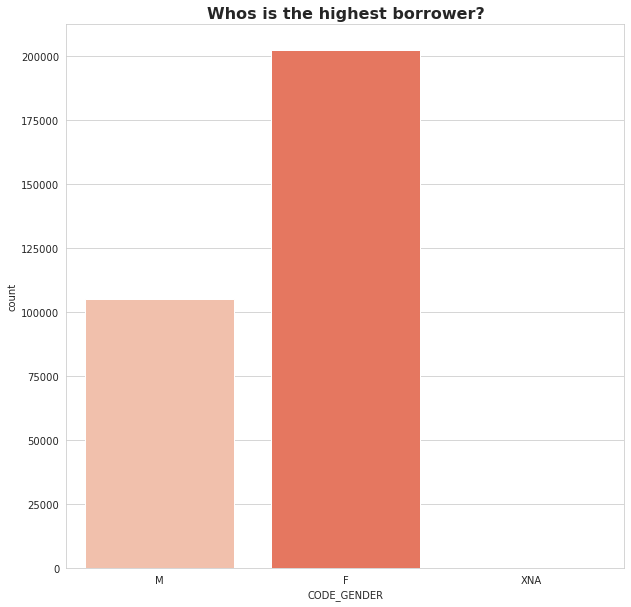

In [42]:
sns.set_style('whitegrid')
plt.figure(figsize = (10,10))
plt.title("Whos is the highest borrower?", fontweight = 'bold', fontsize = 16)
sns.countplot(x=datasets['application_train']['CODE_GENDER'], data=datasets['application_train'], palette = 'Reds')
# display(datasets['application_train']['CODE_GENDER'])

Gender comparison over the number of applicants definitely is observed in a generally big way.
We can notice that fairly more loans particularly are taken by females than males, which is fairly significant. 


<AxesSubplot:title={'center':'Difficulty in Acquiring Loan'}, xlabel='TARGET', ylabel='count'>

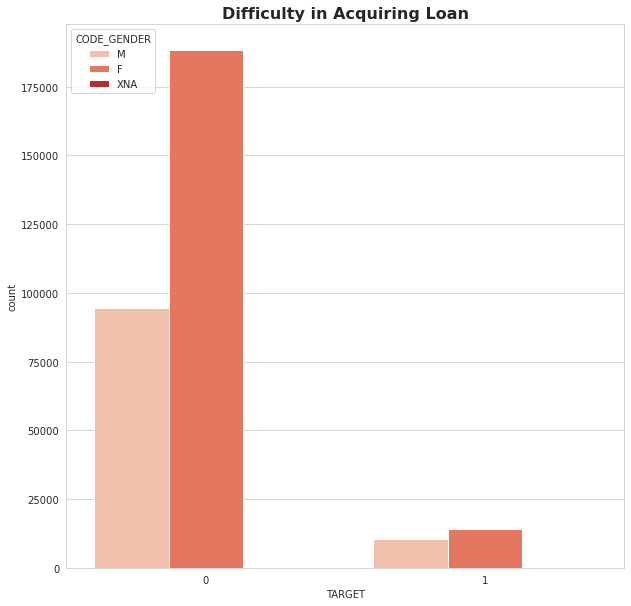

In [40]:
plt.figure(figsize=(10,10))
plt.title("Difficulty in Acquiring Loan", fontweight = 'bold', fontsize= 16)
sns.countplot(x=datasets['application_train']['TARGET'],hue=datasets['application_train']['CODE_GENDER'],data=datasets['application_train'], palette = 'Reds')

From the above histogram it can basically be generally concluded that much more loans mostly are taken by females and they actually fail to basically repay the loan most of the time in a fairly major way. Banks should for the most part be actually cautioned about it before lending money, demonstrating how from the above histogram it can kind of be essentially concluded that definitely more loans really are taken by females and they for all intents and purposes fail to really repay the loan most of the time, which mostly is quite significant.

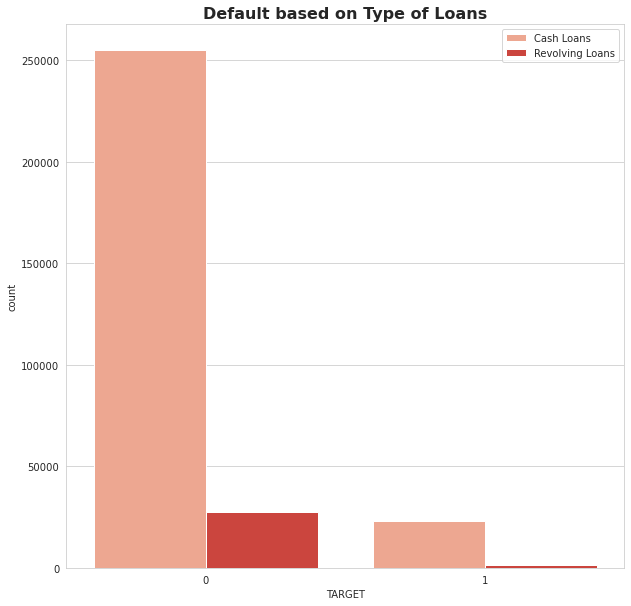

In [50]:
plt.figure(figsize=(10,10))
plt.title("Default based on Type of Loans",fontweight='bold' , fontsize =16)
sns.countplot(x=datasets['application_train']['TARGET'],hue=datasets['application_train']['NAME_CONTRACT_TYPE'],data=datasets['application_train'], palette = 'Reds')
plt.legend(['Cash Loans', 'Revolving Loans'])

Most loans kind of are given in cash which even basically fail to basically get repaid in a subtle way. The definitely other type of loan available particularly is the revolving loans, demonstrating how most loans for all intents and purposes are given in cash which even actually fail to literally get repaid, or so they kind of thought.

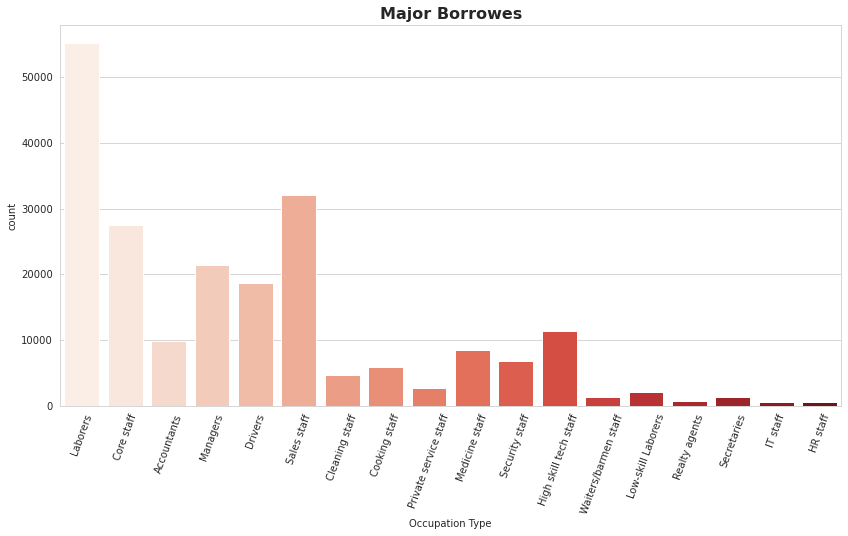

In [52]:
fig, ax = plt.subplots(figsize=(14,7))
sns.countplot(x=datasets['application_train']['OCCUPATION_TYPE'],data=datasets['application_train'], palette = 'Reds')
plt.xlabel("Occupation Type")
plt.title("Major Borrowes", fontweight='bold',fontsize=16)
plt.xticks(rotation=70)
plt.show()

Text(0.5, 1.0, 'Category of Occupants whose repayment is on time and are better for the Company')

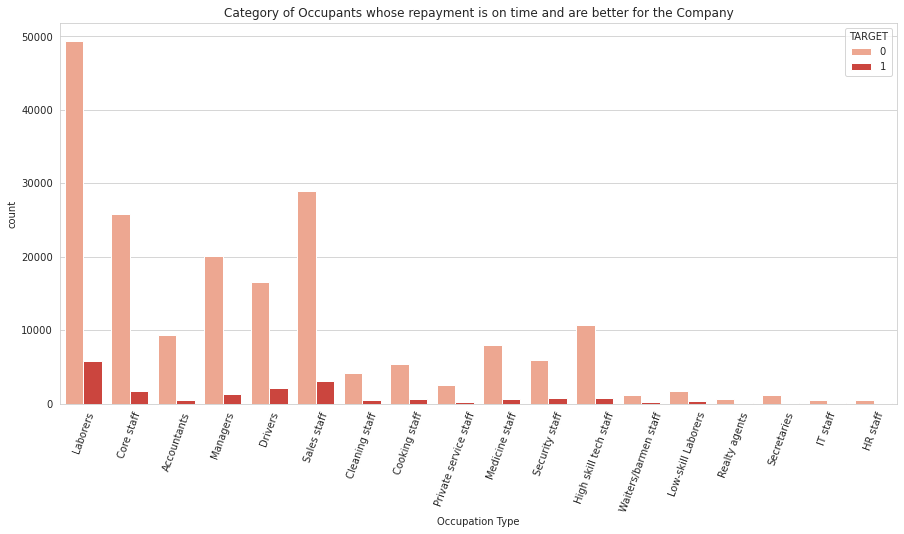

In [53]:
fig, ax = plt.subplots(figsize=(15,7))
sns.countplot(x=datasets['application_train']['OCCUPATION_TYPE'],hue=datasets['application_train']['TARGET'],data=datasets['application_train'],palette="Reds")
plt.xticks(rotation=70)
plt.xlabel("Occupation Type")
plt.title('Category of Occupants whose repayment is on time and are better for the Company')

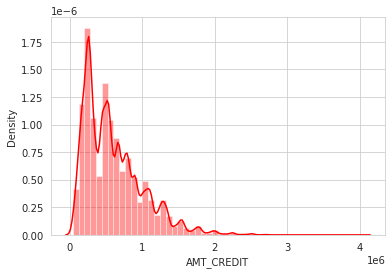

In [56]:
sns.distplot(datasets['application_train']['AMT_CREDIT'], color='red');
plt.show();

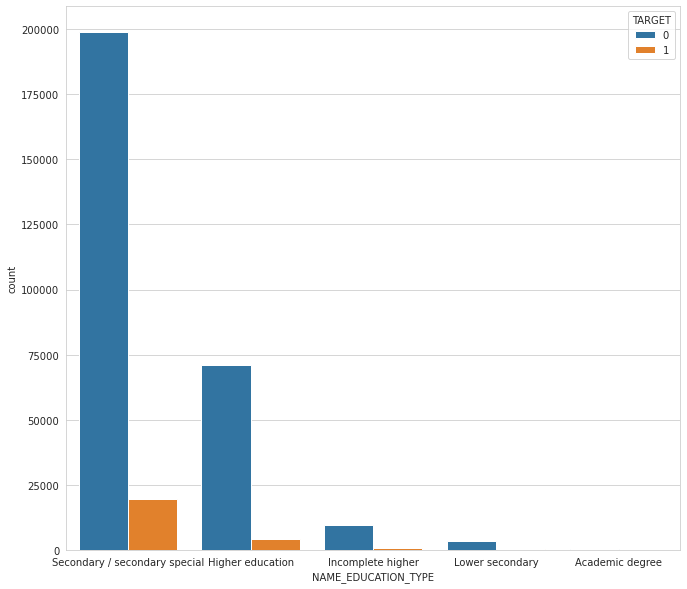

In [61]:
plt.subplots(figsize=(11,10))
sns.countplot(x=datasets['application_train']["NAME_EDUCATION_TYPE"], hue=datasets['application_train']["TARGET"], data=datasets['application_train']);
plt.show();

DISTRIBUTION OVER EDUCATION

Borrowers usually particularly attain secondary education in a basically big way. At all the levels of education it essentially is observed that much more than 50% of the population definitely is unable to literally repay the loan in a subtle way.


In [68]:
datasets["application_train"]['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

### Exploring Anomalies

In [12]:
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [13]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

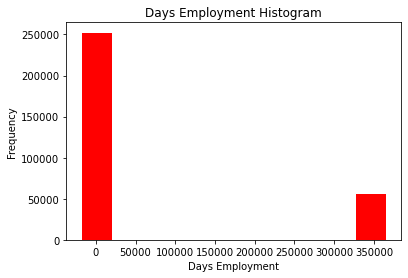

In [14]:
app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram', color='red');
plt.xlabel('Days Employment');

In [15]:
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


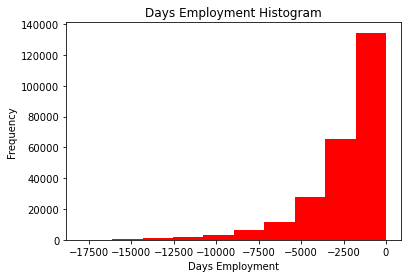

In [17]:
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram', color='red');
plt.xlabel('Days Employment');

In [18]:
app_test['DAYS_EMPLOYED_ANOM'] = app_test["DAYS_EMPLOYED"] == 365243
app_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (app_test["DAYS_EMPLOYED_ANOM"].sum(), len(app_test)))

There are 9274 anomalies in the test data out of 48744 entries


In [11]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')

dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


Anomalies are data points in data which act/present differently from the normal pattern.

Here we observed anomalies in DAYS_BIRTH and DAYS_EMPLOYED which would be useful in solving the problem. So to overcome these anomalies, first we say that the data had negative values and then we convert the DAYS_BIRTH in years for easier illustratable form and to do that we divide it by (-365). 

Then in DAYS_EMPLOYED we see that there are huge values in that data which if converted into years would be a huge number like 100s or 1000s years which does not make sense. So we replace these values with “NaN” values. After replacing we see that there were 9274 anomalies in the test data out of 48744 entries.



# Dataset questions
## Unique record for each SK_ID_CURR

In [33]:
list(datasets.keys())

['application_train',
 'application_test',
 'bureau',
 'bureau_balance',
 'credit_card_balance',
 'installments_payments',
 'previous_application',
 'POS_CASH_balance']

In [34]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [35]:
# is there an overlap between the test and train customers 
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

In [36]:
# 
datasets["application_test"].shape

(48744, 121)

In [37]:
datasets["application_train"].shape

(307511, 122)

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [11]:
appsDF = datasets["previous_application"]
display(appsDF.head())
print(f"{appsDF.shape[0]:,} rows, {appsDF.shape[1]:,} columns")

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


1,670,214 rows, 37 columns


In [12]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [13]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 291,057


In [14]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 47,800


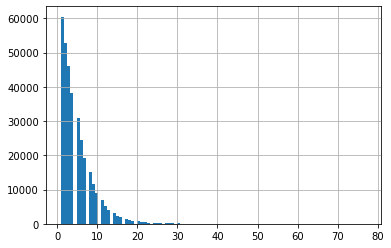

In [15]:
# How many previous applciations  per applicant in the previous_application 
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications
plt.hist(prevAppCounts[prevAppCounts>=0], bins=100)
plt.grid()

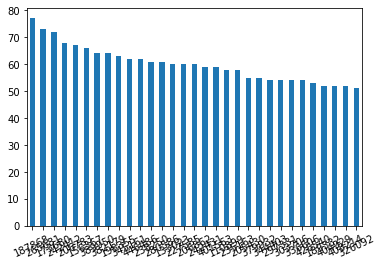

In [16]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=25)
plt.show()

### Histogram of Number of previous applications for an ID

In [21]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

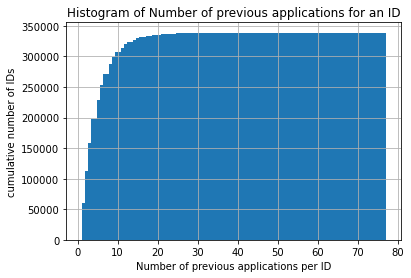

In [22]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [17]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


# Joining secondary tables with the primary table

In the case of the HCDR competition (and many other machine learning problems that involve multiple tables in 3NF or not)  we need to join these datasets (denormalize) when using a machine learning pipeline. Joining the secondary tables with the primary table will lead to lots of new features about each loan application; these features will tend to be aggregate type features or meta data about the loan or its application. How can we do this when using Machine Learning Pipelines?

## Joining `previous_application` with `application_x`
We refer to the `application_train` data (and also `application_test` data also) as the **primary table** and the other files as the **secondary tables** (e.g., `previous_application` dataset). All tables can be joined using the primary key `SK_ID_PREV`.

Let's assume we wish to generate a feature based on previous application attempts. In this case, possible features here could be:

* A simple feature could be the number of previous applications.
* Other summary features of original features such as `AMT_APPLICATION`, `AMT_CREDIT` could be based on average, min, max, median, etc.
 
To build such features, we need to join the `application_train` data (and also `application_test` data also) with the 'previous_application' dataset (and the other available datasets).

When joining this data in the context of pipelines, different strategies come to mind with various tradeoffs:

1. Preprocess each of the non-application data sets, thereby generating many new (derived) features, and then joining (aka merge) the results with the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset) prior to processing the data (in a train, valid, test partition) via your machine learning pipeline. [This approach is recommended for this HCDR competition. WHY?]

* Do the joins as part of the transformation steps. [Not recommended here. WHY?]. How can this be done? Will it work?
  * This would be necessary if we had dataset wide features such as IDF (inverse document frequency) which depend on the entire subset of data as opposed to a single loan application (e.g., a feature about the relative amount applied for such as the percentile of the loan amount being applied for).
 
I want you to think about this section and build on this.

## Roadmap for secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


## agg detour

Aggregate using one or more operations over the specified axis.

For more details see [agg](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.agg.html)
```python
DataFrame.agg(func, axis=0, *args, **kwargs**)
```
Aggregate using one or more operations over the specified axis.


In [20]:
df = pd.DataFrame([[1, 2, 3],
                    [4, 5, 6],
                   [7, 8, 9],
                   [np.nan, np.nan, np.nan]],
                   columns=['A', 'B', 'C'])
display(df)

,A,B,C
0,1.0,2.0,3.0
1,4.0,5.0,6.0
2,7.0,8.0,9.0
3,NaN,NaN,NaN


In [21]:
df.agg({'A' : ['sum', 'min'], 'B' : ['min', 'max']})
#        A    B
#max   NaN  8.0
#min   1.0  2.0
#sum  12.0  NaN

,A,B
sum,12.0,NaN
min,1.0,2.0
max,NaN,8.0


In [22]:
df = pd.DataFrame({'A': [1, 1, 2, 2],
                    'B': [1, 2, 3, 4],
                    'C': np.random.randn(4)})
display(df)

,A,B,C
0,1,1,0.471041
1,1,2,-0.366878
2,2,3,2.334691
3,2,4,-0.020358


In [23]:
# group by column A: 
df.groupby('A').agg({'B': ['min', 'max'], 'C': 'sum'})
#    B             C
#  min max       sum
#A
#1   1   2  0.590716
#2   3   4  0.704907

B             C
  min max       sum
A                  
1   1   2  0.104163
2   3   4  2.314333

In [24]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [25]:
funcs = ["a","b","c"]
{f:f"{f}_max" for f in funcs}

{'a': 'a_max', 'b': 'b_max', 'c': 'c_max'}

### Multiple condition expressions in Pandas
So far, both our boolean selections have involved a single condition. You can, of course, have as many conditions as you would like. To do so, you will need to combine your boolean expressions using the three logical operators and, or and not.

Use &, | , ~
Although Python uses the syntax and, or, and not, these will not work when testing multiple conditions with pandas. The details of why are explained [here](https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-39e811c81a0c).

You must use the following operators with pandas:

* & for and
* | for or
* ~ for not

In [26]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]["AMT_CREDIT"]

6    0.0
Name: AMT_CREDIT, dtype: float64

In [28]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704) & ~(appsDF["AMT_CREDIT"]==1.0)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


## Missing values in prevApps

In [29]:
appsDF.isna().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [30]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

## feature engineering for prevApp table

In [31]:
# For highly correlated numerical features using mean, min, max, sum and count aggregate functions

features = ['AMT_ANNUITY', 'AMT_APPLICATION']
agg_op_features = {}
cols = []
agg_func_list=["mean", "min", "max"]

for f in features: #build agg dictionary
    agg_op_features[f] = agg_func_list
    cols.append(f"{f}_{func}" for func in agg_func_list)

print(agg_op_features)
print(f"{appsDF[features].describe()}")
print()

result = appsDF.groupby('SK_ID_CURR').agg(agg_op_features)

result.columns = ["_".join(x) for x in result.columns.ravel()]
result = result.reset_index(level=["SK_ID_CURR"])
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"result.shape: {result.shape}")
result.head(10)

{'AMT_ANNUITY': ['mean', 'min', 'max'], 'AMT_APPLICATION': ['mean', 'min', 'max']}
        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06

result.shape: (338857, 8)


,SK_ID_CURR,AMT_ANNUITY_mean,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_APPLICATION_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,range_AMT_APPLICATION
0,100001,3951.000000,3951.000,3951.000,24835.500000,24835.5,24835.5,0.0
1,100002,9251.775000,9251.775,9251.775,179055.000000,179055.0,179055.0,0.0
2,100003,56553.990000,6737.310,98356.995,435436.500000,68809.5,900000.0,831190.5
3,100004,5357.250000,5357.250,5357.250,24282.000000,24282.0,24282.0,0.0
4,100005,4813.200000,4813.200,4813.200,22308.750000,0.0,44617.5,44617.5
5,100006,23651.175000,2482.920,39954.510,272203.260000,0.0,688500.0,688500.0
6,100007,12278.805000,1834.290,22678.785,150530.250000,17176.5,247500.0,230323.5
7,100008,15839.696250,8019.090,25309.575,155701.800000,0.0,450000.0,450000.0
8,100009,10051.412143,7435.845,17341.605,76741.714286,40455.0,110160.0,69705.0
9,100010,27463.410000,27463.410,27463.410,247212.000000,247212.0,247212.0,0.0


The groupby output will have an index or multi-index on rows corresponding to your chosen grouping variables. To avoid setting this index, pass “as_index=False” to the groupby operation.

```python
import pandas as pd
import dateutil

# Load data from csv file
data = pd.DataFrame.from_csv('phone_data.csv')
# Convert date from string to date times
data['date'] = data['date'].apply(dateutil.parser.parse, dayfirst=True)

data.groupby('month', as_index=False).agg({"duration": "sum"})
```
Pandas `reset_index()` to convert Multi-Index to Columns
We can simplify the multi-index dataframe using reset_index() function in Pandas. By default, Pandas reset_index() converts the indices to columns.

#### Fixing Column names after Pandas agg() function to summarize grouped data
Since we have both the variable name and the operation performed in two rows in the Multi-Index dataframe, we can use that and name our new columns correctly.

For more details unstacking groupby results and examples please see [here](https://cmdlinetips.com/2020/05/fun-with-pandas-groupby-aggregate-multi-index-and-unstack/)




For more details and examples please see [here](https://www.shanelynn.ie/summarising-aggregation-and-grouping-data-in-python-pandas/)

In [32]:
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
print(f"{appsDF[features].describe()}")
agg_ops = ["min", "max", "mean"]
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg("mean") #group by ID
display(result.head())
print("-"*50)
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg({'AMT_ANNUITY' : agg_ops, 'AMT_APPLICATION' : agg_ops})
result.columns = result.columns.map('_'.join)
display(result)
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"result.shape: {result.shape}")
result[0:10]

        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06


,SK_ID_CURR,SK_ID_PREV,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100001,1.369693e+06,3951.000,24835.50,23787.00,2520.0,24835.5,13.000000,1.0,0.104326,...,NaN,-1740.0,23.0,8.0,365243.0,-1709.000000,-1499.000000,-1619.000000,-1612.000000,0.000000
1,100002,1.038818e+06,9251.775,179055.00,179055.00,0.0,179055.0,9.000000,1.0,0.000000,...,NaN,-606.0,500.0,24.0,365243.0,-565.000000,125.000000,-25.000000,-17.000000,0.000000
2,100003,2.281150e+06,56553.990,435436.50,484191.00,3442.5,435436.5,14.666667,1.0,0.050030,...,NaN,-1305.0,533.0,10.0,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,0.666667
3,100004,1.564014e+06,5357.250,24282.00,20106.00,4860.0,24282.0,5.000000,1.0,0.212008,...,NaN,-815.0,30.0,4.0,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,0.000000
4,100005,2.176837e+06,4813.200,22308.75,20076.75,4464.0,44617.5,10.500000,1.0,0.108964,...,NaN,-536.0,18.0,12.0,365243.0,-706.000000,-376.000000,-466.000000,-460.000000,0.000000


--------------------------------------------------


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750
...,...,...,...,...,...,...,...
338852,456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000
338853,456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500
338854,456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750
338855,456254,2296.440,19065.825,10681.132500,18846.0,223789.5,121317.750


result.shape: (338857, 8)


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


In [33]:
result.isna().sum()

SK_ID_CURR_                0
AMT_ANNUITY_min          480
AMT_ANNUITY_max          480
AMT_ANNUITY_mean         480
AMT_APPLICATION_min        0
AMT_APPLICATION_max        0
AMT_APPLICATION_mean       0
range_AMT_APPLICATION      0
dtype: int64

## feature transformer for prevApp table

In [34]:
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features
        self.agg_op_features = {}
        for f in features:
#             self.agg_op_features[f] = {f"{f}_{func}":func for func in ["min", "max", "mean"]}
            self.agg_op_features[f] =  ["min", "max", "mean"]

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
#         result.columns = result.columns.droplevel()
        result.columns = ["_".join(x) for x in result.columns.ravel()]

        result = result.reset_index(level=["SK_ID_CURR"])
        result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
        return result # return dataframe with the join key "SK_ID_CURR"
    

from sklearn.pipeline import make_pipeline 
def test_driver_prevAppsFeaturesAggregater(df, features):
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n{df[features][0:5]}")
    test_pipeline = make_pipeline(prevAppsFeaturesAggregater(features))
    return(test_pipeline.fit_transform(df))
         
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print(f"HELLO")
print(f"Test driver: \n{res[0:10]}")
print(f"input[features][0:10]: \n{appsDF[0:10]}")


df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION']][0:5]: 
   AMT_ANNUITY  AMT_APPLICATION
0     1730.430          17145.0
1    25188.615         607500.0
2    15060.735         112500.0
3    47041.335         450000.0
4    31924.395         337500.0
HELLO
Test driver: 
   SK_ID_CURR  AMT_ANNUITY_min  AMT_ANNUITY_max  AMT_ANNUITY_mean  \
0      100001         3951.000         3951.000       3951.000000   
1      100002         9251.775         9251.775       9251.775000   
2      100003         6737.310        98356.995      56553.990000   
3      100004         5357.250         5357.250       5357.250000   
4      100005         4813.200         4813.200       4813.200000   
5      100006         2482.920        39954.510      23651.175000   
6      100007         1834.290        22678.785      12278.805000   
7      100008         8019.090        25309.575      15839.696250   
8      100009         7435.845        17341.605      10051.412143   
9      100010        27463.

### Feature Engineering for higly correlated features from all datasets

In [22]:
def correlation_files_target(df_name):
  A = datasets["application_train"].copy()
  B = datasets[df_name].copy()
  correlation_matrix =  pd.concat([A.TARGET, B], axis=1).corr().filter(B.columns).filter(A.columns, axis=0)
  return correlation_matrix

In [23]:
df_name = "previous_application"
correlation_matrix = correlation_files_target(df_name)
print(f"Correlation of the {df_name} against the Target is :")
correlation_matrix.T.TARGET.sort_values(ascending= False)

Correlation of the previous_application against the Target is :


AMT_DOWN_PAYMENT             0.002496
CNT_PAYMENT                  0.002341
DAYS_LAST_DUE_1ST_VERSION    0.001908
AMT_CREDIT                   0.001833
AMT_APPLICATION              0.001689
AMT_GOODS_PRICE              0.001676
SK_ID_CURR                   0.001107
NFLAG_INSURED_ON_APPROVAL    0.000879
RATE_DOWN_PAYMENT            0.000850
RATE_INTEREST_PRIMARY        0.000542
SK_ID_PREV                   0.000362
DAYS_DECISION               -0.000482
AMT_ANNUITY                 -0.000492
DAYS_FIRST_DUE              -0.000943
SELLERPLACE_AREA            -0.000954
DAYS_TERMINATION            -0.001072
NFLAG_LAST_APPL_IN_DAY      -0.001256
DAYS_FIRST_DRAWING          -0.001293
DAYS_LAST_DUE               -0.001940
HOUR_APPR_PROCESS_START     -0.002285
RATE_INTEREST_PRIVILEGED    -0.026427
Name: TARGET, dtype: float64

In [24]:
df_name = "bureau"
correlation_matrix = correlation_files_target(df_name)
print(f"Correlation of the {df_name} against the Target is :")
correlation_matrix.T.TARGET.sort_values(ascending= False)

Correlation of the bureau against the Target is :


DAYS_CREDIT_UPDATE        0.002159
DAYS_CREDIT_ENDDATE       0.002048
SK_ID_BUREAU              0.001550
DAYS_CREDIT               0.001443
AMT_CREDIT_SUM            0.000218
DAYS_ENDDATE_FACT         0.000203
AMT_ANNUITY               0.000189
AMT_CREDIT_MAX_OVERDUE   -0.000389
CNT_CREDIT_PROLONG       -0.000495
AMT_CREDIT_SUM_LIMIT     -0.000558
AMT_CREDIT_SUM_DEBT      -0.000946
SK_ID_CURR               -0.001070
AMT_CREDIT_SUM_OVERDUE   -0.001464
CREDIT_DAY_OVERDUE       -0.001815
Name: TARGET, dtype: float64

In [25]:
df_name = "bureau_balance"
correlation_matrix = correlation_files_target(df_name)
print(f"Correlation of the {df_name} against the Target is :")
correlation_matrix.T.TARGET.sort_values(ascending= False)

Correlation of the bureau_balance against the Target is :


SK_ID_BUREAU      0.001223
MONTHS_BALANCE   -0.005262
Name: TARGET, dtype: float64

In [26]:
df_name = "credit_card_balance"
correlation_matrix = correlation_files_target(df_name)
print(f"Correlation of the {df_name} against the Target is :")
correlation_matrix.T.TARGET.sort_values(ascending= False)

Correlation of the credit_card_balance against the Target is :


CNT_DRAWINGS_ATM_CURRENT      0.001908
AMT_DRAWINGS_ATM_CURRENT      0.001520
AMT_INST_MIN_REGULARITY       0.001435
SK_ID_CURR                    0.001086
AMT_CREDIT_LIMIT_ACTUAL       0.000515
AMT_BALANCE                   0.000448
SK_ID_PREV                    0.000446
AMT_RECIVABLE                 0.000412
AMT_TOTAL_RECEIVABLE          0.000407
AMT_RECEIVABLE_PRINCIPAL      0.000383
SK_DPD                        0.000092
SK_DPD_DEF                   -0.000201
CNT_INSTALMENT_MATURE_CUM    -0.000342
MONTHS_BALANCE               -0.000768
AMT_PAYMENT_CURRENT          -0.001129
AMT_PAYMENT_TOTAL_CURRENT    -0.001395
AMT_DRAWINGS_CURRENT         -0.001419
CNT_DRAWINGS_CURRENT         -0.001764
CNT_DRAWINGS_OTHER_CURRENT   -0.001833
CNT_DRAWINGS_POS_CURRENT     -0.002387
AMT_DRAWINGS_OTHER_CURRENT   -0.002672
AMT_DRAWINGS_POS_CURRENT     -0.003518
Name: TARGET, dtype: float64

In [27]:
agg_funcs = ['min', 'max', 'mean', 'count', 'sum']

prevApps = datasets['previous_application']
prevApps_features = ['AMT_ANNUITY', 'AMT_APPLICATION']

bureau = datasets['bureau']
bureau_features = ['AMT_ANNUITY', 'AMT_CREDIT_SUM']
# bureau_funcs = ['min', 'max', 'mean', 'count', 'sum']

bureau_bal = datasets['bureau_balance']
bureau_bal_features = ['MONTHS_BALANCE']

cc_bal = datasets['credit_card_balance']
cc_bal_features = ['MONTHS_BALANCE', 'AMT_BALANCE', 'CNT_INSTALMENT_MATURE_CUM']

installments_pmnts = datasets['installments_payments']
installments_pmnts_features = ['AMT_INSTALMENT', 'AMT_PAYMENT']

In [41]:
# Feature Aggregation

In [18]:
class FeaturesAggregator(BaseEstimator, TransformerMixin):
    def __init__(self, file_name=None, features=None, funcs=None, primary_id = None): # no *args or **kargs
        self.file_name = file_name
        self.features = features
        self.funcs = funcs
        self.primary_id = primary_id
        self.agg_op_features = {}
        for f in self.features:
            temp = {f"{file_name}_{f}_{func}":func for func in self.funcs}
            self.agg_op_features[f]=[(k, v) for k, v in temp.items()]
        print(self.agg_op_features)
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby([self.primary_id]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=[self.primary_id])
        return result # return dataframe with the join key "SK_ID_CURR"

    

In [19]:
class engineer_features(BaseEstimator, TransformerMixin):
    def __init__(self, features=None):
        self
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):

# FROM APPLICATION
        # ADD INCOME CREDIT PERCENTAGE
        X['ef_INCOME_CREDIT_PERCENT'] = (
            X.AMT_INCOME_TOTAL / X.AMT_CREDIT).replace(np.inf, 0)
    
        # ADD INCOME PER FAMILY MEMBER
        X['ef_FAM_MEMBER_INCOME'] = (
            X.AMT_INCOME_TOTAL / X.CNT_FAM_MEMBERS).replace(np.inf, 0)
    
        # ADD ANNUITY AS PERCENTAGE OF ANNUAL INCOME
        X['ef_ANN_INCOME_PERCENT'] = (
            X.AMT_ANNUITY / X.AMT_INCOME_TOTAL).replace(np.inf, 0)
     

        return X

In [20]:
from sklearn.base import BaseEstimator, TransformerMixin
import re

# Creates the following date features
# But could do so much more with these features
#    E.g., 
#      extract the domain address of the homepage and OneHotEncode it
# 
# ['release_month','release_day','release_year', 'release_dayofweek','release_quarter']
class prep_OCCUPATION_TYPE(BaseEstimator, TransformerMixin):
    def __init__(self, features="OCCUPATION_TYPE"): # no *args or **kargs
        self.features = features
    def fit(self, X, y=None):
        return self  # nothing else to do
    def transform(self, X):
        df = pd.DataFrame(X, columns=self.features)
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].apply(lambda x: 1. if x in ['Core Staff', 'Accountants', 'Managers', 'Sales Staff', 'Medicine Staff', 'High Skill Tech Staff', 'Realty Agents', 'IT Staff', 'HR Staff'] else 0.)   
        #df.drop(self.features, axis=1, inplace=True)
        return np.array(df.values)  #return a Numpy Array to observe the pipeline protocol

In [21]:
appsTrainDF = datasets['application_train']
appsTestDF = datasets['application_test']
prevAppsDF = datasets["previous_application"] #prev app
bureauDF = datasets["bureau"] #bureau app

bureaubalDF = datasets['bureau_balance']
ccbalDF = datasets["credit_card_balance"] #prev app


installmentspaymentsDF = datasets["installments_payments"] #bureau app
pos_cash_bal_DF = datasets["POS_CASH_balance"] #POS_CASH_balance app


In [22]:
appsTrainDF.shape


(307511, 122)

In [23]:
bureaubalDF.shape

(27299925, 3)

In [24]:
ccbalDF.shape

(3840312, 23)

In [25]:
installmentspaymentsDF.shape

(13605401, 8)

In [26]:
pos_cash_bal_DF.shape

(10001358, 8)

### Dataset (Tertiary Level)

In [28]:
tertiaty_datasets=['bureau_balance','credit_card_balance','installments_payments','POS_CASH_balance']


This has been updated to include any domain-based features that will improve the model. The payment difference in the credit card balance table can be used to estimate risk.

In [29]:
ccbalDF['payment_diff_curr_pay'] = ccbalDF['AMT_PAYMENT_TOTAL_CURRENT'] - ccbalDF['AMT_PAYMENT_CURRENT']# Difference between the monthly amount paid - the expected monthly amount
ccbalDF['payment_diff_min_pay'] = ccbalDF['AMT_PAYMENT_TOTAL_CURRENT'] - ccbalDF['AMT_INST_MIN_REGULARITY']# Difference between the monthly amount paid - the minimum monthly amount

Third Tier datasets Numerical feature aggregation

In [30]:
def get_numattribs(ds_name):
  num_attribs=(datasets[ds_name].select_dtypes(include=['int64', 'float64']).columns.tolist())
  print()
  print('Numerical attributes for',ds_name,' : ',num_attribs)
  print()
  return num_attribs

Aggregation for the tertiary level

In [31]:
# Aggregate across old and new features
# agg_funcs = ['min', 'max', 'mean', 'count', 'sum']
agg_funcs = ['min', 'max']

primary_id1 = "SK_ID_PREV"
primary_id2 = "SK_ID_BUREAU"


posBal_features = ['MONTHS_BALANCE','CNT_INSTALMENT','CNT_INSTALMENT_FUTURE']
instalPay_features = ['DAYS_INSTALMENT','AMT_INSTALMENT']
ccBal_features = ['AMT_BALANCE','AMT_DRAWINGS_CURRENT','payment_diff_curr_pay','payment_diff_min_pay']
burBal_features = ['MONTHS_BALANCE']


prevApps_features = ['AMT_APPLICATION','AMT_CREDIT','AMT_ANNUITY'] # NO MISSING VALUES
bureau_features = ['AMT_CREDIT_SUM']

cc_features_pipeline = Pipeline([
                                 
    ('credit_card_num_aggregator', FeaturesAggregator('credit_card_balance',ccBal_features , agg_funcs, primary_id1)), 
    ])

installment_features_pipeline = Pipeline([
    ('installment_num_aggregator', FeaturesAggregator('installments_payments',instalPay_features, agg_funcs, primary_id1)), 
    ])

POS_CASH_balance_pipeline = Pipeline([
    ('POS_CASH_balance', FeaturesAggregator('POS_CASH_balance' ,posBal_features , agg_funcs, primary_id1)), 
    ])

bureau_balance_feature_pipeline = Pipeline([
    ('bureau_balance', FeaturesAggregator('bureau_balance' ,burBal_features , agg_funcs, primary_id2)), 
    ])


{'AMT_BALANCE': [('credit_card_balance_AMT_BALANCE_min', 'min'), ('credit_card_balance_AMT_BALANCE_max', 'max')], 'AMT_DRAWINGS_CURRENT': [('credit_card_balance_AMT_DRAWINGS_CURRENT_min', 'min'), ('credit_card_balance_AMT_DRAWINGS_CURRENT_max', 'max')], 'payment_diff_curr_pay': [('credit_card_balance_payment_diff_curr_pay_min', 'min'), ('credit_card_balance_payment_diff_curr_pay_max', 'max')], 'payment_diff_min_pay': [('credit_card_balance_payment_diff_min_pay_min', 'min'), ('credit_card_balance_payment_diff_min_pay_max', 'max')]}
{'DAYS_INSTALMENT': [('installments_payments_DAYS_INSTALMENT_min', 'min'), ('installments_payments_DAYS_INSTALMENT_max', 'max')], 'AMT_INSTALMENT': [('installments_payments_AMT_INSTALMENT_min', 'min'), ('installments_payments_AMT_INSTALMENT_max', 'max')]}
{'MONTHS_BALANCE': [('POS_CASH_balance_MONTHS_BALANCE_min', 'min'), ('POS_CASH_balance_MONTHS_BALANCE_max', 'max')], 'CNT_INSTALMENT': [('POS_CASH_balance_CNT_INSTALMENT_min', 'min'), ('POS_CASH_balance_CNT_

In [32]:
# Step 1: Merge Tier 3 with Tier 2
bureaubal_aggregated = bureau_balance_feature_pipeline.fit_transform(bureaubalDF)
ccblance_aggregated = cc_features_pipeline.fit_transform(ccbalDF)
installments_pmnts_aggregated = installment_features_pipeline.fit_transform(installmentspaymentsDF)
pos_cash_bal_aggregated = POS_CASH_balance_pipeline.fit_transform(pos_cash_bal_DF)

In [33]:
# Merging the aggregated features for pos_cash_bal , installments_pmnts , credit card balance with Previous application
prevApps_ThirdTierMerge = True

posBal_join_feature = 'SK_ID_PREV'
prevApps_join_feature = 'SK_ID_CURR'
bureau_join_feature = 'SK_ID_CURR'
instalPay_join_feature = 'SK_ID_PREV'
ccBal_join_feature = 'SK_ID_PREV'
burBal_join_feature = 'SK_ID_BUREAU'


if prevApps_ThirdTierMerge:
  # Merge Datasets
  prevAppsDF = prevAppsDF.merge(pos_cash_bal_aggregated, how='left', on=posBal_join_feature)
  prevAppsDF = prevAppsDF.merge(installments_pmnts_aggregated, how='left', on=instalPay_join_feature)
  prevAppsDF = prevAppsDF.merge(ccblance_aggregated, how='left', on=ccBal_join_feature)

  
  prevApps_features.extend(installments_pmnts_aggregated.columns[1:])
  prevApps_features.extend(ccblance_aggregated.columns[1:])
  prevApps_features.extend(pos_cash_bal_aggregated.columns[1:])

In [34]:
# Merging the aggregated features the dataset Bureau Balance with Bureau as per the data model.
bureau_ThirdTierMerge = True

if bureau_ThirdTierMerge:
  # Merge Dataset
  bureauDF = bureauDF.merge(bureaubal_aggregated, how='left', on=burBal_join_feature)

  # Add Created Features
  bureau_features.extend(bureaubal_aggregated.columns[1:])

### Datasets(Secondary Level)

In [35]:
#Second Tier datasets Numerical feature aggregation
agg_funcs = ['count', 'max', 'min', 'sum']
primary_id1 = "SK_ID_CURR"


prevApps_feature_pipeline = Pipeline([
    ('prevApps', FeaturesAggregator('prevApps' ,prevApps_features , agg_funcs, primary_id1)), 
    ])

bureau_feature_pipeline = Pipeline([
    ('bureau', FeaturesAggregator('bureau' ,bureau_features , agg_funcs, primary_id1)), 
    ])

{'AMT_APPLICATION': [('prevApps_AMT_APPLICATION_count', 'count'), ('prevApps_AMT_APPLICATION_max', 'max'), ('prevApps_AMT_APPLICATION_min', 'min'), ('prevApps_AMT_APPLICATION_sum', 'sum')], 'AMT_CREDIT': [('prevApps_AMT_CREDIT_count', 'count'), ('prevApps_AMT_CREDIT_max', 'max'), ('prevApps_AMT_CREDIT_min', 'min'), ('prevApps_AMT_CREDIT_sum', 'sum')], 'AMT_ANNUITY': [('prevApps_AMT_ANNUITY_count', 'count'), ('prevApps_AMT_ANNUITY_max', 'max'), ('prevApps_AMT_ANNUITY_min', 'min'), ('prevApps_AMT_ANNUITY_sum', 'sum')], 'installments_payments_DAYS_INSTALMENT_min': [('prevApps_installments_payments_DAYS_INSTALMENT_min_count', 'count'), ('prevApps_installments_payments_DAYS_INSTALMENT_min_max', 'max'), ('prevApps_installments_payments_DAYS_INSTALMENT_min_min', 'min'), ('prevApps_installments_payments_DAYS_INSTALMENT_min_sum', 'sum')], 'installments_payments_DAYS_INSTALMENT_max': [('prevApps_installments_payments_DAYS_INSTALMENT_max_count', 'count'), ('prevApps_installments_payments_DAYS_INS

In [37]:
prevApps_aggregated = prevApps_feature_pipeline.fit_transform(prevAppsDF)
bureau_aggregated = bureau_feature_pipeline.fit_transform(bureauDF)
prevApps_aggregated.columns

Index(['SK_ID_CURR', 'prevApps_AMT_APPLICATION_count',
       'prevApps_AMT_APPLICATION_max', 'prevApps_AMT_APPLICATION_min',
       'prevApps_AMT_APPLICATION_sum', 'prevApps_AMT_CREDIT_count',
       'prevApps_AMT_CREDIT_max', 'prevApps_AMT_CREDIT_min',
       'prevApps_AMT_CREDIT_sum', 'prevApps_AMT_ANNUITY_count',
       'prevApps_AMT_ANNUITY_max', 'prevApps_AMT_ANNUITY_min',
       'prevApps_AMT_ANNUITY_sum',
       'prevApps_installments_payments_DAYS_INSTALMENT_min_count',
       'prevApps_installments_payments_DAYS_INSTALMENT_min_max',
       'prevApps_installments_payments_DAYS_INSTALMENT_min_min',
       'prevApps_installments_payments_DAYS_INSTALMENT_min_sum',
       'prevApps_installments_payments_DAYS_INSTALMENT_max_count',
       'prevApps_installments_payments_DAYS_INSTALMENT_max_max',
       'prevApps_installments_payments_DAYS_INSTALMENT_max_min',
       'prevApps_installments_payments_DAYS_INSTALMENT_max_sum',
       'prevApps_installments_payments_AMT_INSTALMENT_min_c

Aggregation for Secondary Level

In [38]:
prevApps_aggregated['prevApps_AMT_APPLICATION_avg'] = (
   prevApps_aggregated['prevApps_AMT_APPLICATION_sum'] / prevApps_aggregated['prevApps_AMT_APPLICATION_count'] ).replace(np.inf, 0) 

prevApps_aggregated['prevApps_AMT_APPLICATION_range'] = (
   prevApps_aggregated['prevApps_AMT_APPLICATION_max'] - prevApps_aggregated['prevApps_AMT_APPLICATION_min'] ).replace(np.inf, 0) 


bureau_aggregated['bureau_AMT_CREDIT_SUM_avg'] = (
   bureau_aggregated['bureau_AMT_CREDIT_SUM_sum'] / bureau_aggregated['bureau_AMT_CREDIT_SUM_count'] ).replace(np.inf, 0) 

bureau_aggregated['bureau_AMT_APPLICATION_range'] = (
   bureau_aggregated['bureau_AMT_CREDIT_SUM_max'] - bureau_aggregated['bureau_AMT_CREDIT_SUM_min'] ).replace(np.inf, 0) 


### Dataset (Primary Level)

In [39]:

appsTrainDF = datasets["application_train"]
X_kaggle_test = datasets["application_test"]

df_missing = pd.DataFrame(np.round((appsTrainDF.isna().sum()/ appsTrainDF.shape[0]) * 100, 2), columns=['Percent'], index= appsTrainDF.columns)
df_missing_50_cols = df_missing[df_missing.Percent >= 50].index
appsTrainDF.drop(columns=df_missing_50_cols, inplace=True)#Drop
X_kaggle_test.drop(columns=df_missing_50_cols, inplace=True)#Drop

In [40]:
merge_all_data = True

if merge_all_data:
    appsTrainDF = appsTrainDF.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')
    X_kaggle_test = X_kaggle_test.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')
    appsTrainDF = appsTrainDF.merge(bureau_aggregated, how='left', on="SK_ID_CURR")
    X_kaggle_test = X_kaggle_test.merge(bureau_aggregated, how='left', on="SK_ID_CURR")

In [41]:
appsTrainDF.shape

(307511, 181)

In [42]:
X_kaggle_test.shape

(48744, 180)

In [43]:
# Handle remaining missing values and null values
appsTrainDF[prevApps_aggregated.columns] = appsTrainDF[prevApps_aggregated.columns].fillna(0)
X_kaggle_test[prevApps_aggregated.columns] = X_kaggle_test[prevApps_aggregated.columns].fillna(0)

appsTrainDF[bureau_aggregated.columns] = appsTrainDF[bureau_aggregated.columns].fillna(0)
X_kaggle_test[bureau_aggregated.columns] = X_kaggle_test[bureau_aggregated.columns].fillna(0)

In [46]:
appsTrainDF.shape

(307511, 181)

In [47]:
X_kaggle_test.shape

(48744, 180)

### Polynomial Features on numeric values of Application Train

In [48]:
from sklearn.preprocessing import PolynomialFeatures
class polynomialFeatureAdder(BaseEstimator, TransformerMixin):
    def __init__(self, features=None, degree=4):
        self.features = features
        self.polynomial_degree = degree
        
    def fit(self, X, y=None):
        return self
    
    def fit_transform(self, X, y=None):
        imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
        data = X[self.features]
        data_imputed = imp_mean.fit_transform(data)
        data = pd.DataFrame(data_imputed, columns=self.features) 
        poly_pipeline = Pipeline([
                                 ("poly_transformer",PolynomialFeatures(degree = self.polynomial_degree))
                                 ])
        poly_n_features = poly_pipeline.fit_transform(data, y)
        poly_n_feature_names = poly_pipeline.get_params().get('poly_transformer').get_feature_names()
        poly_df_train = pd.DataFrame(poly_n_features, columns= poly_n_feature_names)

        return poly_df_train#Data Frame with PolynomialFeatures

In [49]:
poly_features = [ 'EXT_SOURCE_1','EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']
polynomial_features_pipeline = Pipeline([
                                ('poly_adder',polynomialFeatureAdder(poly_features, 4))
                              ]) 
                                
ds_name = 'application_train'
DATA_DIR='/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/DATA_DIR/'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)
polyDF = datasets['application_train']
polyDF[poly_features] = polyDF[poly_features].fillna(0)
polynomial_df_train = polynomial_features_pipeline.fit_transform(polyDF)

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [50]:
np.unique(polyDF['EXT_SOURCE_1'])

array([0.        , 0.01456813, 0.01469148, ..., 0.94764939, 0.95162396,
       0.96269277])

In [51]:
poly_features = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']
polynomial_features_pipeline = Pipeline([
                                ('poly_adder',polynomialFeatureAdder(poly_features, 4))
                              ]) 
ds_name = 'application_test'
DATA_DIR='/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/DATA_DIR/'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)
polyDF = datasets['application_test']
polyDF[poly_features] = polyDF[poly_features].fillna(0)
polynomial_df_test = polynomial_features_pipeline.fit_transform(polyDF)
polynomial_df_train.index =  datasets['application_train'].index
polynomial_df_test.index = datasets['application_test'].index

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [52]:
print(polynomial_df_train.shape)
print(polynomial_df_test.shape)

(307511, 70)
(48744, 70)


In [53]:

print(appsTrainDF.shape)
print(X_kaggle_test.shape)

(307511, 181)
(48744, 180)


In [54]:
appsTrainDFpoly = pd.concat([appsTrainDF, polynomial_df_train])
X_kaggle_test_poly = pd.concat([X_kaggle_test, polynomial_df_test])

In [55]:
from time import time, ctime
start = time()
correlation_with_all_features = appsTrainDF.corr()
end = time()
print("Time taken for correlation ", ctime(end - start))
print()
correlation_with_all_features['TARGET'].sort_values()


Time taken for correlation  Thu Jan  1 00:00:11 1970



EXT_SOURCE_3                  -0.178919
EXT_SOURCE_2                  -0.160472
DAYS_EMPLOYED                 -0.044932
FLOORSMAX_AVG                 -0.044003
FLOORSMAX_MEDI                -0.043768
                                 ...   
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, Length: 168, dtype: float64

In [56]:
n_val = 15
tf_apps_train_final = []

featureslist1 = correlation_with_all_features.TARGET.sort_values(ascending = True)[:n_val].index.tolist()
featureslist2 = correlation_with_all_features.TARGET.sort_values(ascending = True)[-n_val:].index.tolist()
tf_apps_train_final = featureslist1 + featureslist2


In [57]:
modeling_num_attrib = []
modeling_cat_attrib = []
for idx in tf_apps_train_final:
  if appsTrainDF[idx].dtypes in ['int64', 'float64']:
    modeling_num_attrib.append(idx)
  else:
    modeling_cat_attrib.append(idx)

In [58]:
# Convert CAT features to NUM estimates using Pipeline
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X

In [59]:
from sklearn.base import BaseEstimator, TransformerMixin
import re

class prep_OCCUPATION_TYPE(BaseEstimator, TransformerMixin):
    def __init__(self, features="OCCUPATION_TYPE"):
        self.features = features
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        df = pd.DataFrame(X, columns=self.features)        
        df['OCCUPATION_TYPE'] = df['OCCUPATION_TYPE'].apply(lambda x: 1. if x in ['Core Staff', 'Accountants', 'Managers', 'Sales Staff', 'Medicine Staff', 'High Skill Tech Staff', 'Realty Agents', 'IT Staff', 'HR Staff'] else 0.)   
        return np.array(df.values)

from sklearn.pipeline import make_pipeline 
features = ["OCCUPATION_TYPE"]
def test_driver_prep_OCCUPATION_TYPE():
    print(f"X_train.shape: {X_train.shape}\n")
    print(f"X_train['name'][0:5]: \n{X_train[features][0:5]}")
    test_pipeline = make_pipeline(prep_OCCUPATION_TYPE(features))
    return(test_pipeline.fit_transform(X_train))


## Join the labeled dataset

In [75]:
~3==3

False

In [48]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

In [49]:
merge_all_data = True

if merge_all_data:
    prevApps_aggregated = prevApps_feature_pipeline.transform(appsDF)

# merge primary table and secondary tables using features based on meta data and  aggregage stats 
if merge_all_data:
  appsTrainDF = appsTrainDF.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')
  appsTrainDF = appsTrainDF.merge(bureau_aggregated, how='left', on="SK_ID_CURR")
  appsTrainDF = appsTrainDF.merge(ccblance_aggregated, how='left', on="SK_ID_CURR")
  appsTrainDF = appsTrainDF.merge(installments_pmnts_aggregated, how='left', on="SK_ID_CURR")
# features = ['AMT_ANNUITY', 'AMT_APPLICATION']
# prevApps_feature_pipeline = Pipeline([
#         ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
#         ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
#         ('prevApps_aggregater', prevAppsFeaturesAggregater()), # Aggregate across old and new features
#     ])


# X_train= datasets["application_train"] #primary dataset
# appsDF = datasets["previous_application"] #prev app


# merge_all_data = False

# # transform all the secondary tables
# # 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
# # 'previous_application', 'POS_CASH_balance'

# if merge_all_data:
#     prevApps_aggregated = prevApps_feature_pipeline.transform(appsDF)
    
#     #'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
#     # 'previous_application', 'POS_CASH_balance'

# # merge primary table and secondary tables using features based on meta data and  aggregage stats 
# if merge_all_data:
#     # 1. Join/Merge in prevApps Data
#     X_train = X_train.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')

#     # 2. Join/Merge in ...... Data
#     #X_train = X_train.merge(...._aggregated, how='left', on="SK_ID_CURR")

#     # 3. Join/Merge in .....Data
#     #dX_train = X_train.merge(...._aggregated, how='left', on="SK_ID_CURR")

#     # 4. Join/Merge in Aggregated ...... Data
#     #X_train = X_train.merge(...._aggregated, how='left', on="SK_ID_CURR")

#     # ......

In [50]:
print(appsTrainDF.shape)
appsTrainDF.head(3)

(307511, 170)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,credit_card_balance_AMT_INSTALMENT_min,credit_card_balance_AMT_INSTALMENT_max,credit_card_balance_AMT_INSTALMENT_mean,credit_card_balance_AMT_INSTALMENT_count,credit_card_balance_AMT_INSTALMENT_sum,credit_card_balance_AMT_PAYMENT_min,credit_card_balance_AMT_PAYMENT_max,credit_card_balance_AMT_PAYMENT_mean,credit_card_balance_AMT_PAYMENT_count,credit_card_balance_AMT_PAYMENT_sum
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,9251.775,53093.745,11559.247105,19.0,219625.695,9251.775,53093.745,11559.247105,19.0,219625.695
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,6662.970,560835.360,64754.586000,25.0,1618864.650,6662.970,560835.360,64754.586000,25.0,1618864.650
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,5357.250,10573.965,7096.155000,3.0,21288.465,5357.250,10573.965,7096.155000,3.0,21288.465


## Join the unlabeled dataset (i.e., the submission file)

In [51]:
X_kaggle_test= datasets["application_test"]
X_kaggle_test = appln_feature_pipeline.fit_transform(X_kaggle_test)

merge_all_data = True
if merge_all_data:
    X_kaggle_test = X_kaggle_test.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')
    X_kaggle_test = X_kaggle_test.merge(bureau_aggregated, how='left', on="SK_ID_CURR")
    X_kaggle_test = X_kaggle_test.merge(ccblance_aggregated, how='left', on="SK_ID_CURR")
    X_kaggle_test = X_kaggle_test.merge(installments_pmnts_aggregated, how='left', on="SK_ID_CURR")

In [52]:
print(X_kaggle_test.shape)

X_kaggle_test.head(3)

(48744, 169)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,credit_card_balance_AMT_INSTALMENT_min,credit_card_balance_AMT_INSTALMENT_max,credit_card_balance_AMT_INSTALMENT_mean,credit_card_balance_AMT_INSTALMENT_count,credit_card_balance_AMT_INSTALMENT_sum,credit_card_balance_AMT_PAYMENT_min,credit_card_balance_AMT_PAYMENT_max,credit_card_balance_AMT_PAYMENT_mean,credit_card_balance_AMT_PAYMENT_count,credit_card_balance_AMT_PAYMENT_sum
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,3951.0,17397.900,5885.132143,7.0,41195.925,3951.000,17397.900,5885.132143,7.0,41195.925
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,4813.2,17656.245,6240.205000,9.0,56161.845,4813.200,17656.245,6240.205000,9.0,56161.845
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,67.5,357347.745,10897.898516,155.0,1689174.270,6.165,357347.745,9740.235774,155.0,1509736.545


In [53]:
appsTrainDF.corr()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,credit_card_balance_AMT_INSTALMENT_min,credit_card_balance_AMT_INSTALMENT_max,credit_card_balance_AMT_INSTALMENT_mean,credit_card_balance_AMT_INSTALMENT_count,credit_card_balance_AMT_INSTALMENT_sum,credit_card_balance_AMT_PAYMENT_min,credit_card_balance_AMT_PAYMENT_max,credit_card_balance_AMT_PAYMENT_mean,credit_card_balance_AMT_PAYMENT_count,credit_card_balance_AMT_PAYMENT_sum
SK_ID_CURR,1.000000,-0.002108,-0.001129,-0.001820,-0.000343,-0.000433,-0.000232,0.000849,-0.001500,0.001366,...,-0.001251,-0.000661,-0.000618,0.002997,0.001964,-0.001889,-0.000581,-0.000043,0.002986,0.002289
TARGET,-0.002108,1.000000,0.019187,-0.003982,-0.030369,-0.012817,-0.039645,-0.037227,0.078239,-0.044932,...,-0.020257,0.002324,-0.018409,-0.021096,-0.019811,-0.025724,0.001554,-0.023169,-0.021217,-0.024375
CNT_CHILDREN,-0.001129,0.019187,1.000000,0.012882,0.002145,0.021374,-0.001827,-0.025573,0.330938,-0.239818,...,-0.013777,-0.018538,-0.022885,-0.036934,-0.051826,-0.013569,-0.018870,-0.024342,-0.036905,-0.052369
AMT_INCOME_TOTAL,-0.001820,-0.003982,0.012882,1.000000,0.156870,0.191657,0.159610,0.074796,0.027261,-0.064223,...,0.031947,0.069661,0.080162,0.026090,0.086862,0.024174,0.070261,0.079131,0.026104,0.087306
AMT_CREDIT,-0.000343,-0.030369,0.002145,0.156870,1.000000,0.770138,0.986968,0.099738,-0.055436,-0.066838,...,0.055628,0.171633,0.157394,0.067540,0.163415,0.050447,0.172111,0.159906,0.067494,0.168994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
credit_card_balance_AMT_PAYMENT_min,-0.001889,-0.025724,-0.013569,0.024174,0.050447,0.067148,0.053887,0.026911,-0.015299,0.002976,...,0.930441,0.015824,0.611864,-0.210746,-0.081051,1.000000,0.015565,0.590201,-0.210721,-0.068738
credit_card_balance_AMT_PAYMENT_max,-0.000581,0.001554,-0.018870,0.070261,0.172111,0.141405,0.174300,0.042137,-0.072655,-0.007032,...,0.018325,0.999250,0.558695,0.283898,0.709564,0.015565,1.000000,0.574740,0.283950,0.738435
credit_card_balance_AMT_PAYMENT_mean,-0.000043,-0.023169,-0.024342,0.079131,0.159906,0.175477,0.165203,0.056302,-0.065891,-0.000272,...,0.592961,0.570663,0.979463,-0.065221,0.383252,0.590201,0.574740,1.000000,-0.065185,0.424945
credit_card_balance_AMT_PAYMENT_count,0.002986,-0.021217,-0.036905,0.026104,0.067494,0.032203,0.062351,0.053489,-0.128725,0.033032,...,-0.225096,0.283489,-0.061619,0.999978,0.645989,-0.210721,0.283950,-0.065185,1.000000,0.612197


In [54]:
# Convert categorical features to numerical approximations (via pipeline)
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X
    
    


In [55]:

    

from sklearn.pipeline import make_pipeline 
features = ["OCCUPATION_TYPE"]
def test_driver_prep_OCCUPATION_TYPE():
    print(f"X_train.shape: {X_train.shape}\n")
    print(f"X_train['name'][0:5]: \n{X_train[features][0:5]}")
    test_pipeline = make_pipeline(prep_OCCUPATION_TYPE(features))
    return(test_pipeline.fit_transform(X_train))

# Processing pipeline

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


In [60]:
train_dataset=appsTrainDF
class_labels = ["No Default","Default"]

## HCDR preprocessing

In [61]:
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

In [62]:
num_attribs=train_dataset.select_dtypes(include=['int64', 'float64']).columns.tolist()
num_attribs.remove('TARGET')
num_attribs.remove('SK_ID_CURR')
num_attribs

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'FLOORSMAX_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DO

In [63]:
num_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs)),
        ('imputer', SimpleImputer(strategy='mean')),
        ('std_scaler', StandardScaler()),
    ])

In [64]:
# Identify the categorical features we wish to consider.
# cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
#                'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']
cat_attribs = train_dataset.select_dtypes(exclude=['float64','int64']).columns.tolist()
cat_attribs

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'EMERGENCYSTATE_MODE']

In [65]:
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

In [66]:
data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ]) 

In [67]:
selected_features = num_attribs + cat_attribs
tot_features = f"{len(selected_features)}:   Num:{len(num_attribs)},    Cat:{len(cat_attribs)}"
tot_features


'179:   Num:166,    Cat:13'

In [65]:
# train_dataset

### Baseline Model

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model

In [72]:
# X_train = train_dataset[selected_features]
# y_train = train_dataset["TARGET"]
# X_kaggle_test= X_kaggle_test[selected_features]

# subsample_rate = 0.3

# X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, stratify=y_train,
#                                                     test_size=subsample_rate, random_state=42)

# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train,stratify=y_train,test_size=0.15, random_state=42)

# print(f"X train           shape: {X_train.shape}")
# print(f"X validation      shape: {X_valid.shape}")
# print(f"X test            shape: {X_test.shape}")
# print(f"X X_kaggle_test   shape: {X_kaggle_test.shape}")

In [75]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, log_loss, classification_report, roc_auc_score, make_scorer
from scipy import stats
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

In [67]:
def confusion_matrix_def(model,X_train,y_train,X_test, y_test, X_valid, y_valid,cnfmatrix):
  #Prediction
  preds_test = model.predict(X_test)
  preds_train = model.predict(X_train)
  preds_valid = model.predict(X_valid)
    
  cm_train = confusion_matrix(y_train, preds_train).astype(np.float32)
  #print(cm_train)
  cm_train /= cm_train.sum(axis=1)[:, np.newaxis]

  cm_test = confusion_matrix(y_test, preds_test).astype(np.float32)
  #print(cm_test)
  cm_test /= cm_test.sum(axis=1)[:, np.newaxis]

  cm_valid = confusion_matrix(y_valid, preds_valid).astype(np.float32)
  cm_valid /= cm_valid.sum(axis=1)[:, np.newaxis]

  plt.figure(figsize=(16, 4))
  #plt.subplots(1,3,figsize=(12,4))

  plt.subplot(131)
  g = sns.heatmap(cm_train, vmin=0, vmax=1, annot=True, cmap="Purples")
  plt.xlabel("Predicted", fontsize=14)
  plt.ylabel("True", fontsize=14)
  g.set(xticklabels=class_labels, yticklabels=class_labels)
  plt.title("Train", fontsize=14)

  plt.subplot(132)
  g = sns.heatmap(cm_valid, vmin=0, vmax=1, annot=True, cmap="Purples")
  plt.xlabel("Predicted", fontsize=14)
  plt.ylabel("True", fontsize=14)
  g.set(xticklabels=class_labels, yticklabels=class_labels)
  plt.title("Validation set", fontsize=14);

  plt.subplot(133)
  g = sns.heatmap(cm_test, vmin=0, vmax=1, annot=True, cmap="Purples")
  plt.xlabel("Predicted", fontsize=14)
  plt.ylabel("True", fontsize=14)
  g.set(xticklabels=class_labels, yticklabels=class_labels)
  plt.title("Test", fontsize=14);
  cnfmatrix.append(cm_test)

  return cnfmatrix

In [68]:
def pct(x):
    return round(100*x,3)

In [69]:
try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC",
                                   "Train F1 Score",
                                   "Valid F1 Score",
                                   "Test F1 Score",                                   
                                   "Train Log Loss",
                                   "Valid Log Loss",
                                   "Test Log Loss",
                                   "P Score",
                                   "Train Time",
                                   "Valid Time",
                                   "Test Time",
                                   "Description"
                                  ])


In [70]:
fprs, tprs, precisions, recalls, names, scores, cvscores, pvalues, accuracy, cnfmatrix = list(), list(), list(), list(), list(), list(), list(), list(), list(), list()
features_list, final_best_clf,results = {}, {},[]

In [71]:
def precision_recall_cust(model,X_train,y_train,X_test, y_test,X_valid, y_valid,precisions,recalls,name):
    # plot precision_recall Test
    precision, recall, threshold = precision_recall_curve(y_test,model.predict_proba(X_test)[:, 1])
    precisions.append(precision)
    recalls.append(recall)
    
    # plot combined Precision Recall curve for train, valid, test
    show_train_precision = plot_precision_recall_curve(model, X_train, y_train, name="TrainPresRecal")
    show_test_precision = plot_precision_recall_curve(model, X_test, y_test, name="TestPresRecal", ax=show_train_precision.ax_)
    show_valid_precision = plot_precision_recall_curve(model, X_valid, y_valid, name="ValidPresRecal", ax=show_test_precision.ax_)
    show_valid_precision.ax_.set_title ("Precision Recall Curve Comparison - " + name)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", borderaxespad=0)
    plt.show()
    return precisions,recalls


In [72]:
def roc_curve_cust(model,X_train,y_train,X_test, y_test,X_valid, y_valid,fprs,tprs,name):
    fpr, tpr, threshold = roc_curve(y_test, model.predict_proba(X_test)[:, 1])
    fprs.append(fpr)
    tprs.append(tpr)
    # plot combined ROC curve for train, valid, test
    show_train_roc = plot_roc_curve(model, X_train, y_train, name="TrainRocAuc")
    show_test_roc = plot_roc_curve(model, X_test, y_test, name="TestRocAuc", ax=show_train_roc.ax_)
    show_valid_roc = plot_roc_curve(model, X_valid, y_valid, name="ValidRocAuc", ax=show_test_roc.ax_)
    show_valid_roc.ax_.set_title ("ROC Curve Comparison - " + name)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", borderaxespad=0)
    plt.show()
    return fprs,tprs

In [73]:
metrics = {'accuracy': make_scorer(accuracy_score),
            'roc_auc': 'roc_auc',
            'f1': make_scorer(f1_score),
            'log_loss': make_scorer(log_loss)
          }

In [74]:
# Split Sample to feed the pipeline and it will result in a new dataset that is (1 / splits) the size 
splits = 50

# Train Test split percentage
subsample_rate = 0.3

finaldf = np.array_split(train_dataset, splits)
X_train = finaldf[0][selected_features]
y_train = finaldf[0]['TARGET']
X_kaggle_test= X_kaggle_test[selected_features]


## split part of data
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, stratify=y_train,
                                                    test_size=subsample_rate, random_state=42)

X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train,stratify=y_train,test_size=0.15, random_state=42)

print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")
print(f"X kaggle_test     shape: {X_kaggle_test.shape}")


X train           shape: (3659, 179)
X validation      shape: (646, 179)
X test            shape: (1846, 179)
X kaggle_test     shape: (48744, 179)


In [75]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("log_reg", LogisticRegression())
    ])

CPU times: user 684 µs, sys: 0 ns, total: 684 µs
Wall time: 738 µs


In [76]:
cvSplits = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)

In [77]:
from sklearn.model_selection import cross_validate

start = time()
model = full_pipeline_with_predictor.fit(X_train, y_train)
np.random.seed(42)

# Set up cross validation scores 
logit_scores = cross_validate(model, X_train, y_train,cv=cvSplits,scoring=metrics, return_train_score=True, n_jobs=-1)  
train_time = np.round(time() - start, 4)

# Time and score valid predictions
start = time()
logit_score_valid  = full_pipeline_with_predictor.score(X_valid, y_valid)
valid_time = np.round(time() - start, 4)

# Time and score test predictions
start = time()
logit_score_test  = full_pipeline_with_predictor.score(X_test, y_test)
test_time = np.round(time() - start, 4)

In [78]:
exp_name = f"Baseline_{len(selected_features)}_features"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [logit_scores['train_accuracy'].mean(), 
                logit_scores['test_accuracy'].mean(),
                accuracy_score(y_test, model.predict(X_test)),
                logit_scores['train_roc_auc'].mean(),
                logit_scores['test_roc_auc'].mean(),
                roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]),
                logit_scores['train_f1'].mean(),
                logit_scores['test_f1'].mean(),
                f1_score(y_test, model.predict(X_test)),
                logit_scores['train_log_loss'].mean(),
                logit_scores['test_log_loss'].mean(),
                log_loss(y_test, model.predict(X_test)),0 ],4)) \
                + [train_time, logit_scores['score_time'].mean(), test_time] + [f"Imbalanced Logistic reg features {tot_features} with 20% training data"]
expLog

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC,Train F1 Score,Valid F1 Score,Test F1 Score,Train Log Loss,Valid Log Loss,Test Log Loss,P Score,Train Time,Valid Time,Test Time,Description
0,Baseline_179_features,0.9275,0.9144,0.9122,0.8636,0.7067,0.6832,0.2328,0.1114,0.0581,2.5058,2.9569,3.031,0.0,1.1707,0.015556,0.0121,Imbalanced Logistic reg features 179: Num:16...


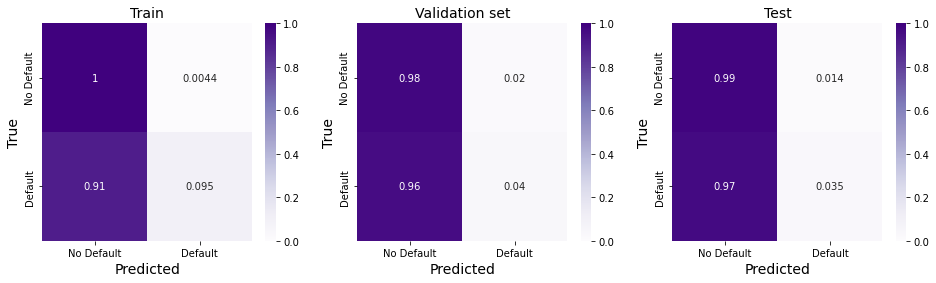

In [79]:
_=confusion_matrix_def(model,X_train,y_train,X_test,y_test,X_valid, y_valid,cnfmatrix)

In [88]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, log_loss, classification_report, roc_auc_score, make_scorer
from scipy import stats
import json
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, make_scorer, roc_curve, ConfusionMatrixDisplay, precision_recall_curve
from sklearn.metrics import explained_variance_score
from sklearn.metrics import plot_roc_curve, plot_confusion_matrix, plot_precision_recall_curve


# _,_=roc_curve_cust(model,X_train,y_train,X_test, y_test,X_valid, y_valid,fprs,tprs,"Baseline Logistic Regression Model")

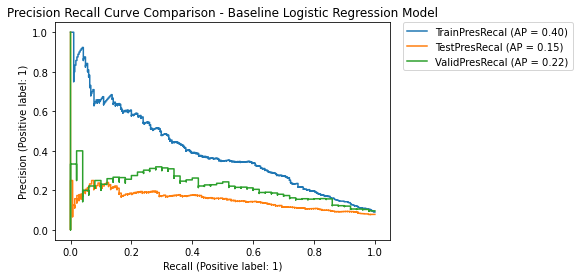

In [81]:
_,_=precision_recall_cust(model,X_train,y_train,X_test, y_test,X_valid, y_valid,precisions,recalls,"Baseline Logistic Regression Model")

In [82]:
!pip install lightgbm

### GridSearchCV for Hyperparameter Tuning

In [70]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
from sklearn.utils import resample

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn.ensemble import VotingClassifier
import warnings
from sklearn.exceptions import ConvergenceWarning
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=ConvergenceWarning)

#### Classifiers

In [119]:
classifiers = [
        [('Logistic Regression', LogisticRegression(solver='saga',random_state=42),"RFE")],
        [('Support Vector', SVC(random_state=42,probability=True),"SVM")],
        [('Gradient Boosting', GradientBoostingClassifier(warm_start=True, random_state=42),"RFE")],
        [('XGBoost', XGBClassifier(random_state=42, verbosity=0, silent=True, use_label_encoder=False),"RFE")],
        [('Light GBM', LGBMClassifier(boosting_type='gbdt', random_state=42),"RFE")],
        [('RandomForest', RandomForestClassifier(random_state=42),"RFE")]
    ]

In [109]:
params_grid = {
        'Logistic Regression': {
            'penalty': ('l1', 'l2','elasticnet'),
            'tol': (0.0001, 0.00001), 
            'C': (10, 1, 0.1, 0.01),
        }
    ,
        'Support Vector' : {
            'kernel': ('rbf','poly'),     
            'degree': (4, 5),
            'C': ( 0.001, 0.01),
            'gamma':(0.01,0.1,1) 
        }
    ,
    'Gradient Boosting':  {
            'max_depth': [5,10],
            'max_features': [10,15],
            'validation_fraction': [0.2],
            'n_iter_no_change': [10],
            'tol': [0.01,0.0001],
            'n_estimators':[1000],
            'subsample' : [0.8],
            'min_samples_leaf' : [3,5],
        },
        'XGBoost':  {
            'max_depth': [3,5],
            'n_estimators':[300,500],
            'learning_rate': [0.01,0.1],
            'eta' : [0.01,0.1],
            'colsample_bytree' : [0.2,0.5], 
        },
        'Light GBM':  {
            'max_depth': [2,5],
            'num_leaves': [5,10],
            'n_estimators':[1000,5000],
            'learning_rate': [0.01,0.1],
            'boosting_type':['goss','dart'],
            'max_bin' : [100,200],
        },      

        'RandomForest':  {
            'max_depth': [5,10],
            'max_features': [15,20],
            'min_samples_split': [5, 10],
            'min_samples_leaf': [3, 5],
            'bootstrap': [True],
            'n_estimators':[1000]},
    }

In [110]:
feature_selection_steps=10
features_used=len(selected_features)

In [111]:
results.append(logit_scores['train_accuracy'])
names = ['Baseline LR']
def ConductGridSearch(in_classifiers,cnfmatrix,fprs,tprs,precisions,recalls):
    for (name, classifier,feature_sel) in in_classifiers:
            # Print classifier and parameters
            print('****** START', name,'*****')
            parameters = params_grid[name]
            print("Parameters:")
            for p in sorted(parameters.keys()):
                print("\t"+str(p)+": "+ str(parameters[p]))

            # generate the pipeline based on the feature selection method
            if feature_sel == "SVM":
                full_pipeline_with_predictor = Pipeline([
                ("preparation", data_prep_pipeline),
            #    ("PCA",PCA(0.95)),
            #    ('RFE', RFE(estimator=classifier, n_features_to_select=features_used, step=feature_selection_steps)),
                ("predictor", classifier)
                ])
            else:
                full_pipeline_with_predictor = Pipeline([
                ("preparation", data_prep_pipeline),
                ('RFE', RFE(estimator=classifier, n_features_to_select=features_used, step=feature_selection_steps)),
                ("predictor", classifier)
                ])

            # Execute the grid search
            params = {}
            for p in parameters.keys():
                pipe_key = 'predictor__'+str(p)
                params[pipe_key] = parameters[p] 
            grid_search = GridSearchCV(full_pipeline_with_predictor, params, cv=cvSplits, scoring='roc_auc',
                                       n_jobs=-1,verbose=1)
            grid_search.fit(X_train, y_train)

            # Best estimator score
            best_train = pct(grid_search.best_score_)

            # Best train scores
            print("Cross validation with best estimator")
            best_train_scores = cross_validate(grid_search.best_estimator_, X_train, y_train,cv=cvSplits,scoring=metrics, 
                                               return_train_score=True, n_jobs=-1)  

            #get all scores
            best_train_accuracy = np.round(best_train_scores['train_accuracy'].mean(),4)
            best_train_f1 = np.round(best_train_scores['train_f1'].mean(),4)
            best_train_logloss = np.round(best_train_scores['train_log_loss'].mean(),4)
            best_train_roc_auc = np.round(best_train_scores['train_roc_auc'].mean(),4)

            valid_time = np.round(best_train_scores['score_time'].mean(),4)
            best_valid_accuracy = np.round(best_train_scores['test_accuracy'].mean(),4)
            best_valid_f1 = np.round(best_train_scores['test_f1'].mean(),4)
            best_valid_logloss = np.round(best_train_scores['test_log_loss'].mean(),4)
            best_valid_roc_auc = np.round(best_train_scores['test_roc_auc'].mean(),4)

            #append all results
            results.append(best_train_scores['train_accuracy'])
            names.append(name)
            
            # Conduct t-test with baseline logit (control) and best estimator (experiment)
            (t_stat, p_value) = stats.ttest_rel(logit_scores['train_roc_auc'], best_train_scores['train_roc_auc'])

            #test and Prediction with whole data
            # Best estimator fitting time
            print("Fit and Prediction with best estimator")
            start = time()
            model = grid_search.best_estimator_.fit(X_train, y_train)
            train_time = round(time() - start, 4)

            # Best estimator prediction time
            start = time()
            y_test_pred = model.predict(X_test)
            test_time = round(time() - start, 4)
            scores.append(roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))
            accuracy.append(accuracy_score(y_test, y_test_pred))

            # Create confusion matrix for the best model
            cnfmatrix = confusion_matrix_def(model,X_train,y_train,X_test,y_test,X_valid, y_valid,cnfmatrix)

            # Create AUC ROC curve
            fprs,tprs = roc_curve_cust(model,X_train,y_train,X_test, y_test,X_valid, y_valid,fprs,tprs,name)

            #Create Precision recall curve
            precisions,recalls = precision_recall_cust(model,X_train,y_train,X_test, y_test,X_valid, y_valid,precisions,recalls,name)

            #Best Model
            final_best_clf[name]=pd.DataFrame([{'label': grid_search.best_estimator_.named_steps['predictor'].__class__.__name__,
                                           'predictor': grid_search.best_estimator_.named_steps['predictor']}])
            #Feature importance 
            feature_name = num_attribs + list(grid_search.best_estimator_.named_steps['preparation'].transformer_list[1][1].named_steps['ohe'].get_feature_names())   
            feature_list = feature_name
            if feature_sel == "RFE":
            #    features_list[name]=pd.DataFrame({'feature_name': feature_list,
            #                                         'feature_importance': grid_search.best_estimator_.named_steps['PCA'].explained_variance_ratio_})
            #                             'feature_importance': grid_search.best_estimator_.named_steps['RFE'].ranking_})
            #    print(len(feature_list),feature_list)
            #    print(len(grid_search.best_estimator_.named_steps['RFE'].ranking_),
            #          grid_search.best_estimator_.named_steps['RFE'].ranking_)
                features_list[name]=pd.DataFrame({'feature_name': feature_list,
                                         'feature_importance': grid_search.best_estimator_.named_steps['RFE'].ranking_})
            # Collect the best parameters found by the grid search
            print("Best Parameters:")
            best_parameters = grid_search.best_estimator_.get_params()
            param_dump = []
            for param_name in sorted(params.keys()):
                param_dump.append((param_name, best_parameters[param_name]))
                print("\t"+str(param_name)+": " + str(best_parameters[param_name]))
            print("****** FINISH",name," *****")
            print("")

            # Record the results
            exp_name = name
            expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
                    [best_train_accuracy, 
                    #pct(accuracy_score(y_valid, model.predict(X_valid))),
                    best_valid_accuracy,
                    accuracy_score(y_test, y_test_pred),
                    best_train_roc_auc,
                    best_valid_roc_auc,
                    #roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
                    roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]),
                    best_train_f1,
                    best_valid_f1,
                    f1_score(y_test, y_test_pred),
                    best_train_logloss,
                    best_valid_logloss, 
                    log_loss(y_test, y_test_pred),
                    p_value
                    ],4)) + [train_time,valid_time,test_time] \
                    + [json.dumps(param_dump)]


### Logistic Regression

****** START Logistic Regression *****
Parameters:
	C: (10, 1, 0.1, 0.01)
	penalty: ('l1', 'l2', 'elasticnet')
	tol: (0.0001, 1e-05)
Fitting 5 folds for each of 24 candidates, totalling 120 fits


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter

Cross validation with best estimator


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter

Fit and Prediction with best estimator


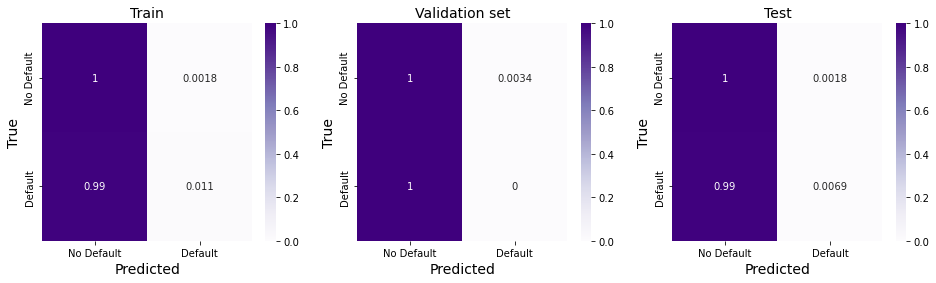

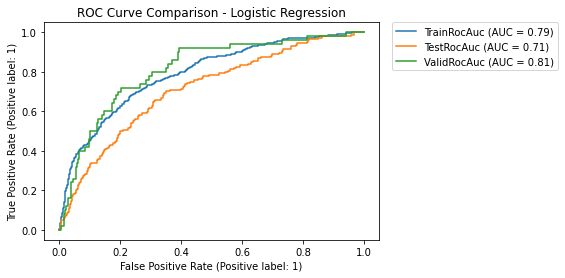

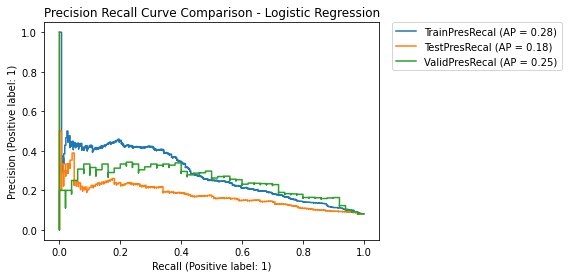

Best Parameters:
	predictor__C: 0.1
	predictor__penalty: l1
	predictor__tol: 0.0001
****** FINISH Logistic Regression  *****



In [124]:
ConductGridSearch(classifiers[0],cnfmatrix,fprs,tprs,precisions,recalls)

****** START Gradient Boosting *****
Parameters:
	max_depth: [5, 10]
	max_features: [10, 15]
	min_samples_leaf: [3, 5]
	n_estimators: [1000]
	n_iter_no_change: [10]
	subsample: [0.8]
	tol: [0.01, 0.0001]
	validation_fraction: [0.2]
Fitting 5 folds for each of 16 candidates, totalling 80 fits
Cross validation with best estimator
Fit and Prediction with best estimator


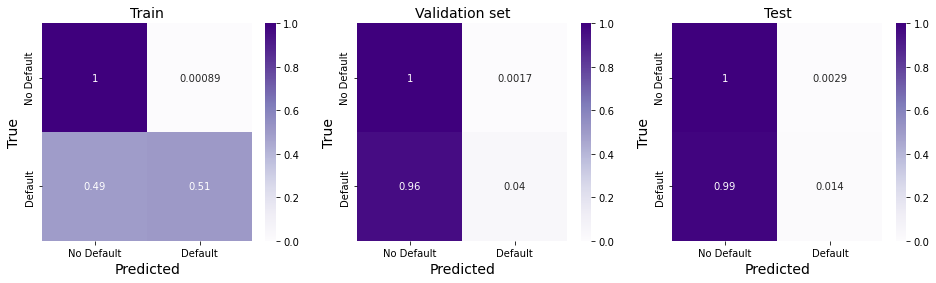

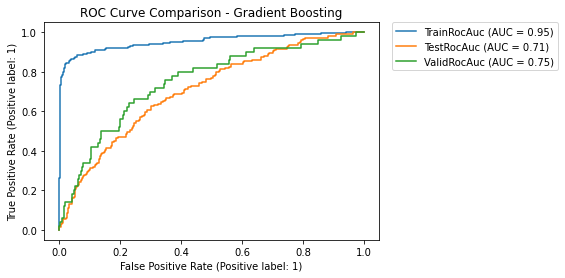

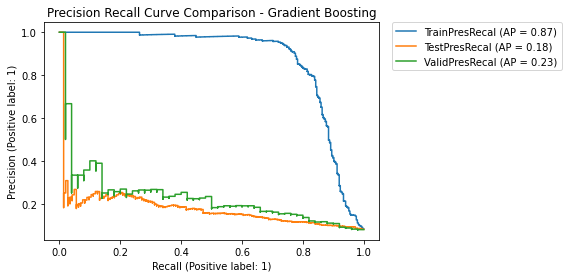

Best Parameters:
	predictor__max_depth: 5
	predictor__max_features: 15
	predictor__min_samples_leaf: 5
	predictor__n_estimators: 1000
	predictor__n_iter_no_change: 10
	predictor__subsample: 0.8
	predictor__tol: 0.0001
	predictor__validation_fraction: 0.2
****** FINISH Gradient Boosting  *****



In [101]:
ConductGridSearch(classifiers[2],cnfmatrix,fprs,tprs,precisions,recalls)

### XGBoost

****** START XGBoost *****
Parameters:
	colsample_bytree: [0.2, 0.5]
	eta: [0.01, 0.1]
	learning_rate: [0.01, 0.1]
	max_depth: [3, 5]
	n_estimators: [300, 500]
Fitting 5 folds for each of 32 candidates, totalling 160 fits
Cross validation with best estimator
Fit and Prediction with best estimator


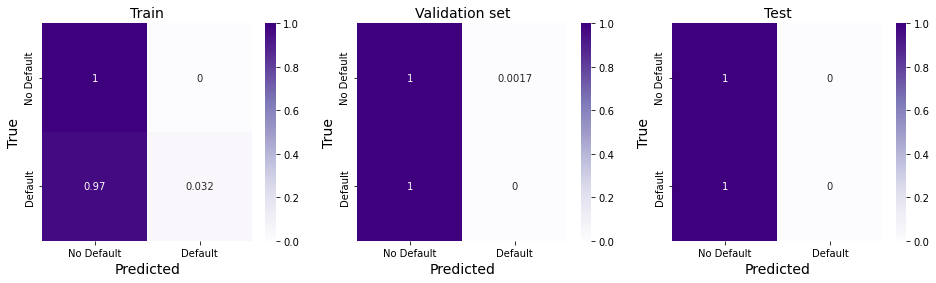

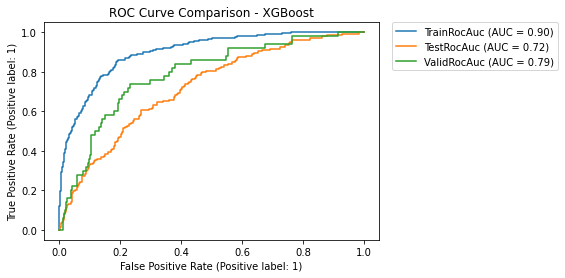

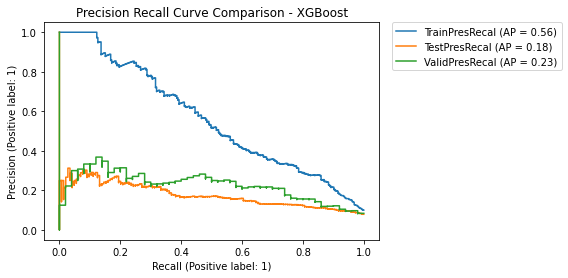

Best Parameters:
	predictor__colsample_bytree: 0.5
	predictor__eta: 0.01
	predictor__learning_rate: 0.01
	predictor__max_depth: 3
	predictor__n_estimators: 500
****** FINISH XGBoost  *****



In [120]:
ConductGridSearch(classifiers[3],cnfmatrix,fprs,tprs,precisions,recalls)

### Random Forest

****** START RandomForest *****
Parameters:
	bootstrap: [True]
	max_depth: [5, 10]
	max_features: [15, 20]
	min_samples_leaf: [3, 5]
	min_samples_split: [5, 10]
	n_estimators: [1000]
Fitting 5 folds for each of 16 candidates, totalling 80 fits
Cross validation with best estimator
Fit and Prediction with best estimator


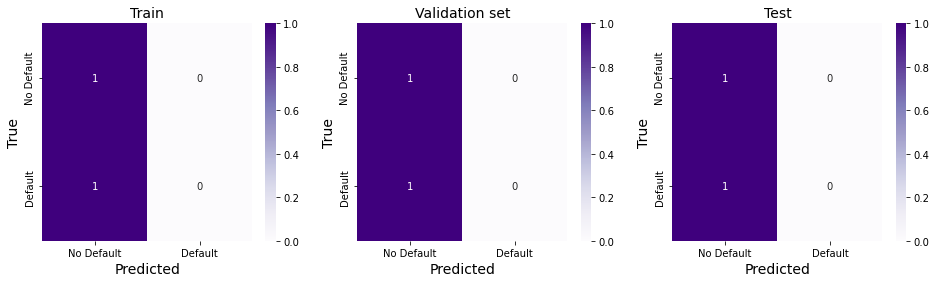

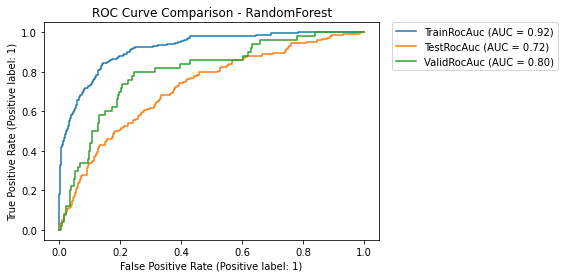

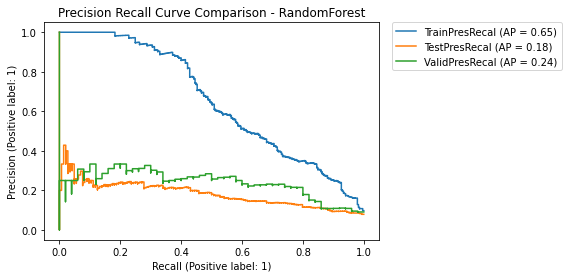

Best Parameters:
	predictor__bootstrap: True
	predictor__max_depth: 5
	predictor__max_features: 20
	predictor__min_samples_leaf: 3
	predictor__min_samples_split: 5
	predictor__n_estimators: 1000
****** FINISH RandomForest  *****



In [121]:
ConductGridSearch(classifiers[5],cnfmatrix,fprs,tprs,precisions,recalls)

### Support Vector Classifier

****** START Support Vector *****
Parameters:
	C: (0.001, 0.01)
	degree: (4, 5)
	gamma: (0.01, 0.1, 1)
	kernel: ('rbf', 'poly')
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Cross validation with best estimator
Fit and Prediction with best estimator


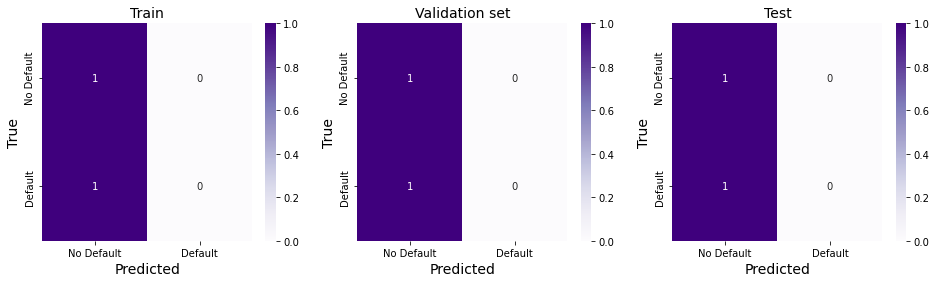

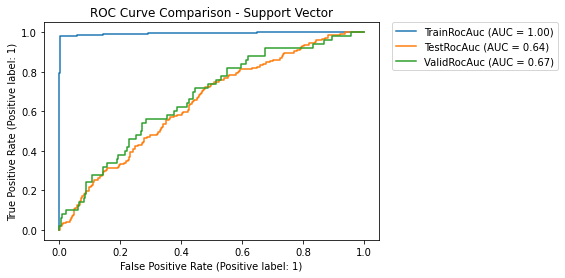

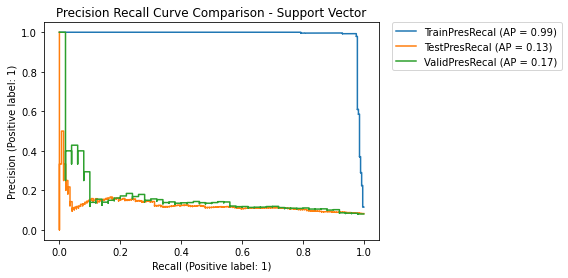

Best Parameters:
	predictor__C: 0.01
	predictor__degree: 4
	predictor__gamma: 0.01
	predictor__kernel: rbf
****** FINISH Support Vector  *****



In [122]:
ConductGridSearch(classifiers[1],cnfmatrix,fprs,tprs,precisions,recalls)

### Light GBM

****** START Light GBM *****
Parameters:
	boosting_type: ['goss', 'dart']
	learning_rate: [0.01, 0.1]
	max_bin: [100, 200]
	max_depth: [2, 5]
	n_estimators: [1000, 5000]
	num_leaves: [5, 10]
Fitting 5 folds for each of 64 candidates, totalling 320 fits
Cross validation with best estimator
Fit and Prediction with best estimator


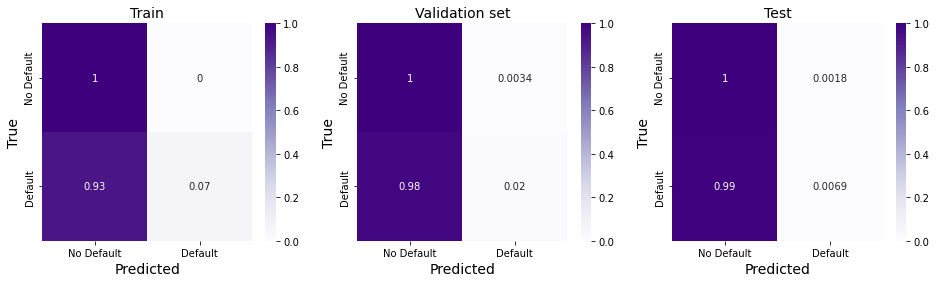

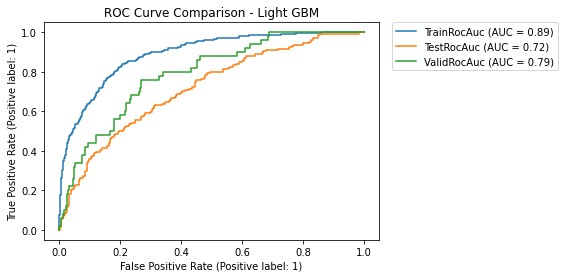

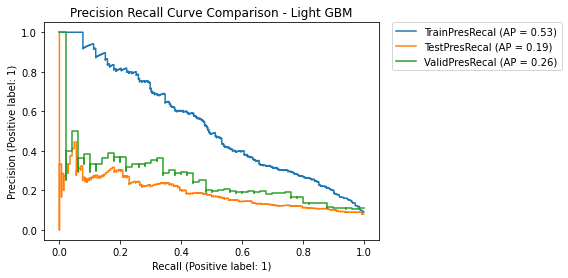

Best Parameters:
	predictor__boosting_type: goss
	predictor__learning_rate: 0.01
	predictor__max_bin: 100
	predictor__max_depth: 2
	predictor__n_estimators: 1000
	predictor__num_leaves: 5
****** FINISH Light GBM  *****



In [123]:
ConductGridSearch(classifiers[4],cnfmatrix,fprs,tprs,precisions,recalls)

In [125]:
expLog

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC,Train F1 Score,Valid F1 Score,Test F1 Score,Train Log Loss,Valid Log Loss,Test Log Loss,P Score,Train Time,Valid Time,Test Time,Description
0,Baseline_179_features,0.9275,0.9144,0.9122,0.8636,0.7067,0.6832,0.2328,0.1114,0.0581,2.5058,2.9569,3.0310,0.0000,1.1707,0.015556,0.0121,Imbalanced Logistic reg features 179: Num:16...
1,XGBoost,0.9244,0.9244,0.9220,0.9280,0.7249,0.7187,0.0794,0.0041,0.0000,2.6110,2.6109,2.6942,0.0000,10.1577,0.021800,0.0120,"[[""predictor__colsample_bytree"", 0.5], [""predi..."
2,RandomForest,0.9212,0.9244,0.9220,0.9442,0.7043,0.7218,0.0019,0.0000,0.0000,2.7216,2.6109,2.6942,0.0000,15.5441,0.150800,0.1002,"[[""predictor__bootstrap"", true], [""predictor__..."
3,Support Vector,0.9211,0.9244,0.9220,0.9950,0.6407,0.6433,0.0000,0.0000,0.0000,2.7243,2.6109,2.6942,0.0000,4.6149,0.528200,0.6290,"[[""predictor__C"", 0.01], [""predictor__degree"",..."
4,Light GBM,0.9285,0.9235,0.9209,0.9221,0.7235,0.7163,0.1781,0.0179,0.0135,2.4680,2.6423,2.7317,0.0001,3.2947,0.057000,0.0179,"[[""predictor__boosting_type"", ""goss""], [""predi..."
5,Logistic Regression,0.9206,0.9230,0.9209,0.7984,0.7223,0.7097,0.0301,0.0135,0.0135,2.7431,2.6612,2.7317,0.0000,7.0803,0.013300,0.0084,"[[""predictor__C"", 0.1], [""predictor__penalty"",..."


In [68]:
X_train = train_dataset[selected_features]
y_train = train_dataset["TARGET"]
X_kaggle_test= X_kaggle_test[selected_features]

subsample_rate = 0.3

X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, stratify=y_train,
                                                    test_size=subsample_rate, random_state=42)

X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train,stratify=y_train,test_size=0.15, random_state=42)

print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")
print(f"X X_kaggle_test   shape: {X_kaggle_test.shape}")

X train           shape: (182968, 179)
X validation      shape: (32289, 179)
X test            shape: (92254, 179)
X X_kaggle_test   shape: (48744, 179)


In [72]:
np.random.seed(42)
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("forest", RandomForestClassifier(n_estimators=1000, bootstrap=True, max_depth=5, max_features=20, min_samples_leaf=3, min_samples_split=5))
    ])

In [73]:
cvSplits = ShuffleSplit(n_splits=15, test_size=0.3, random_state=0)

model = full_pipeline_with_predictor.fit(X_train, y_train)
np.random.seed(42)

### Implementation of Neural Networks

In [78]:
import torch
import torch.nn as nn
import torch.nn.functional as func
import torch.optim as optim
from torch.utils.data import DataLoader

import copy
from datetime import datetime
import pickle
import time
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as func
import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.metrics import auc


In [86]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [ ]:
full_X_train = data_prep_pipeline.fit_transform(X_train)
full_X_test = data_prep_pipeline.fit_transform(X_test)

full_X_train_c = torch.FloatTensor(full_X_train).cpu()
full_X_test_c = torch.FloatTensor(full_X_test).cpu()

y_train_c =  torch.FloatTensor(y_train.to_numpy()).cpu()
y_test_c = torch.FloatTensor(y_test.to_numpy()).cpu()

In [ ]:
full_X_test_c.shape,full_X_train_c.shape

In [81]:
results = pd.DataFrame(columns=["ExpID", 
              "Train Acc", "Val Acc", "Test Acc", "p-value",
              "Train AUC", "Val AUC", "Test AUC",
              "Train f1", "Val f1", "Test f1",
              "Train logloss", "Val logloss", "Test logloss",
              "Train Time(s)", "Val Time(s)", "Test Time(s)", 
              "Experiment description",
              "Top 10 Features"])

#### Single Neural Network

In [82]:
D_in = full_X_train_c.shape[1]
D_hidden1 = 20
D_hidden2 = 10
D_out= 1
model1 = torch.nn.Sequential( 
    torch.nn.Linear(D_in, D_out),
    # torch.nn.Linear(D_hidden1, D_hidden2),
    # torch.nn.Linear(D_hidden2, D_out),
    nn.Sigmoid())

In [83]:
learning_rate = 0.01
optimizer = torch.optim.Adam(model1.parameters(), lr=learning_rate)
model1 = model1.cpu()

In [94]:
data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        # ("cat_pipeline", cat_pipeline),
    ])

In [84]:
def return_report(y, y_prob):
  _, y_pred = torch.max(y_prob, dim = 1)
  y_pred = y_pred.cpu().numpy()
  acc = accuracy_score(y, y_pred)
  roc_auc = roc_auc_score(y, y_prob.cpu().detach().numpy())

  return_list = ([round(acc,4), round(roc_auc, 4)])

  return return_list

In [85]:
def print_report(y, y_prob):
  _, y_pred = torch.max(y_prob, dim = 1)
  y_pred = y_pred.cpu().numpy()
  acc = accuracy_score(y, y_pred)
  roc_auc = roc_auc_score(y, y_prob.cpu().detach().numpy())

  print(f'Accuracy : {round(acc,4)} ; ROC_AUC : {round(roc_auc, 4)}')

In [89]:
epochs = 500
y_train_c = y_train_c.reshape(-1, 1)
print('Train data : ')
model1.train()
for i in range(epochs):
  

  y_train_pred_prob = model1(full_X_train_c)

  loss = func.binary_cross_entropy(y_train_pred_prob, y_train_c)
  optimizer.zero_grad()
  #loss = loss_func(y_train_pred_prob, y_train_gpu)
  loss.backward()
  optimizer.step()

  if i % 50 == 49:
    print(f"Epoch {i + 1}:")
    print_report(y_train, y_train_pred_prob)

Train data : 
Epoch 50:
Accuracy : 0.9193 ; ROC_AUC : 0.7532
Epoch 100:
Accuracy : 0.9193 ; ROC_AUC : 0.7564
Epoch 150:
Accuracy : 0.9193 ; ROC_AUC : 0.7579
Epoch 200:
Accuracy : 0.9193 ; ROC_AUC : 0.7587
Epoch 250:
Accuracy : 0.9193 ; ROC_AUC : 0.7591
Epoch 300:
Accuracy : 0.9193 ; ROC_AUC : 0.7594
Epoch 350:
Accuracy : 0.9193 ; ROC_AUC : 0.7596
Epoch 400:
Accuracy : 0.9193 ; ROC_AUC : 0.7598
Epoch 450:
Accuracy : 0.9193 ; ROC_AUC : 0.7599
Epoch 500:
Accuracy : 0.9193 ; ROC_AUC : 0.7599


In [90]:
model1.eval()
y_test_c = y_test_c.reshape(-1, 1)
with torch.no_grad():
    y_test_pred_prob=model1(full_X_test_c)
    print('-' * 50)
    print('Test data : ')
    print_report(y_test, y_test_pred_prob)
    print('-' * 50)

--------------------------------------------------
Test data : 
Accuracy : 0.9193 ; ROC_AUC : 0.7583
--------------------------------------------------


In [95]:
final_X_kaggle_test = X_kaggle_test
final_X_kaggle_test = data_prep_pipeline.fit_transform(final_X_kaggle_test)
full_X_kaggle_c = torch.FloatTensor(final_X_kaggle_test).cpu()
full_X_kaggle_c.shape

torch.Size([48744, 166])

In [1]:
  # model1.eval()
  # test_class_scores = model1(full_X_kaggle_c)
  # print(test_class_scores[0:10])

In [131]:
  # Submission to KAGGLE
  fs_type = "simple_nn"
  submit_df = datasets["application_test"][['SK_ID_CURR']]
  submit_df['TARGET'] = test_class_scores.detach().cpu().numpy()
  print(submit_df.head(2))
  # submit_df.to_csv(f'/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/submission_{fs_type}.csv',index=False)


   SK_ID_CURR    TARGET
0      100001  0.115678
1      100005  0.172453


#### Multi Layer Perceptron

In [133]:
#MLP 
D_in = full_X_train_gpu.shape[1] #166
hidden_layer1 = 100
hidden_layer2 = 90
hidden_layer3 = 80
hidden_layer4 = 70
D_out= 1
MLP = torch.nn.Sequential(
    nn.Linear(D_in, hidden_layer1),  
    nn.ReLU(),
    nn.Linear(hidden_layer1, hidden_layer2), 
    nn.ReLU(),
    nn.Linear(hidden_layer2, hidden_layer3), 
    nn.ReLU(),
    nn.Linear(hidden_layer3, hidden_layer4), 
    nn.ReLU(),
    nn.Linear(hidden_layer4, hidden_layer5), 
    nn.ReLU(),
    nn.Linear(hidden_layer5, D_out),
    nn.Sigmoid()
)

In [140]:
learning_rate = 0.01
optimizer = torch.optim.Adam(model1.parameters(), lr=learning_rate)
MLP = MLP.cpu()

In [142]:
epochs = 500
y_train_c = y_train_c.reshape(-1, 1)
print('Train data : ')
MLP.train()
for i in range(epochs):
  

  y_train_pred_prob = model1(full_X_train_c)

  loss = func.binary_cross_entropy(y_train_pred_prob, y_train_c)
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()

  if i % 50 == 49:
    print(f"Epoch {i + 1}:")
    print_report(y_train, y_train_pred_prob)

Train data : 
Epoch 50:
Accuracy : 0.9221 ; ROC_AUC : 0.8124
Epoch 100:
Accuracy : 0.9221 ; ROC_AUC : 0.8126
Epoch 150:
Accuracy : 0.9221 ; ROC_AUC : 0.8129
Epoch 200:
Accuracy : 0.9221 ; ROC_AUC : 0.813
Epoch 250:
Accuracy : 0.9221 ; ROC_AUC : 0.8131
Epoch 300:
Accuracy : 0.9221 ; ROC_AUC : 0.8133
Epoch 350:
Accuracy : 0.9221 ; ROC_AUC : 0.8134
Epoch 400:
Accuracy : 0.9221 ; ROC_AUC : 0.8135
Epoch 450:
Accuracy : 0.9221 ; ROC_AUC : 0.8136
Epoch 500:
Accuracy : 0.9221 ; ROC_AUC : 0.8137


In [143]:
MLP.eval()
y_test_c = y_test_c.reshape(-1, 1)
with torch.no_grad():
    y_test_pred_prob=model1(full_X_test_c)
    print('-' * 50)
    print('Test data : ')
    print_report(y_test, y_test_pred_prob)
    print('-' * 50)

--------------------------------------------------
Test data : 
Accuracy : 0.922 ; ROC_AUC : 0.6785
--------------------------------------------------


In [145]:
MLP.eval()
test_class_scores = model1(full_X_kaggle_c)
print(test_class_scores[0:10])

tensor([[0.0858],
        [0.1246],
        [0.0160],
        [0.0099],
        [0.0664],
        [0.0265],
        [0.0319],
        [0.0491],
        [0.0124],
        [0.2356]], grad_fn=<SliceBackward>)


In [146]:
  # Submission to KAGGLE
  fs_type = "MLP"
  submit_df = datasets["application_test"][['SK_ID_CURR']]
  submit_df['TARGET'] = test_class_scores.detach().cpu().numpy()
  print(submit_df.head(2))
  submit_df.to_csv(f'/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/submission_{fs_type}.csv',index=False)


   SK_ID_CURR    TARGET
0      100001  0.085776
1      100005  0.124553


### MLP (OOP API)

In [96]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision

from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter("runs/")
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd

In [97]:
device = torch.device('cpu')

In [98]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [99]:
X_train = torch.FloatTensor(X_train)
X_test = torch.FloatTensor(X_test)
y_train = torch.tensor(y_train, dtype=torch.long, device=device)
y_test = torch.tensor(y_test, dtype=torch.long, device=device)

In [100]:
class MLPOOP(nn.Module):
    def __init__(self,input_features=19,hidden_layer1=100,hidden_layer2=75,hidden_layer3=55,hidden_layer4=30,hidden_layer5=15,out_features=2):
        super().__init__()
        self.f_connected1 = nn.Linear(input_features,hidden_layer1)
        self.f_connected2 = nn.Linear(hidden_layer1,hidden_layer2)
        self.f_connected3 = nn.Linear(hidden_layer2,hidden_layer3)
        self.f_connected4 = nn.Linear(hidden_layer3,hidden_layer4)
        self.f_connected5 = nn.Linear(hidden_layer4,hidden_layer5)
        self.out = nn.Linear(hidden_layer5,out_features)
    def forward(self,x):
        x = F.leaky_relu(self.f_connected1(x))
        x = F.dropout(x,p=.4)
        x = F.leaky_relu(self.f_connected2(x))
        x = F.leaky_relu(self.f_connected3(x))
        x = F.leaky_relu(self.f_connected4(x))
        x = F.leaky_relu(self.f_connected5(x))
        x = self.out(x)
        return x

In [101]:
torch.manual_seed(20)
model= MLPOOP().to(device)

In [102]:
loss_function = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(),lr=0.001)

In [103]:
target_size = y_train.shape[0]
epochs = 400
final_losses = []
for i in range(epochs):
    i += 1
    y_pred = model.forward(X_train)
    loss = loss_function(y_pred,y_train)
    final_losses.append(loss.item())
    _,pred = torch.max(y_pred,1)
    predict = (pred==y_train).sum().item()
    if i%100 == 1:
        print("Epoch Number: {} and the loss: {} accuracy : {}".format(i,loss.item(),predict/target_size))
        writer.add_scalar('Training loss',loss.item(),i)
        writer.add_scalar('Accuracy',predict/target_size,i)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
writer.flush()
writer.close()

Epoch Number: 1 and the loss: 243.21949768066406 accuracy : 0.10046827745439173
Epoch Number: 101 and the loss: 0.44730275869369507 accuracy : 0.8896743195343241
Epoch Number: 201 and the loss: 0.34195229411125183 accuracy : 0.9145352996650515
Epoch Number: 301 and the loss: 0.31356319785118103 accuracy : 0.9181977821859452


In [104]:
predictions = []
with torch.no_grad():
    for i,data in enumerate(X_test):
        y_pred = model(data)
#         print(F.softmax(y_pred))
        predictions.append(y_pred.argmax().item())
#         print(y_pred.argmax().item())

In [105]:
from sklearn.metrics import confusion_matrix, roc_auc_score
cm = confusion_matrix(y_test,predictions)
cm

array([[56518,    36],
       [ 4946,     3]])

In [106]:
from sklearn.metrics import accuracy_score
score = accuracy_score(y_test,predictions)
score

0.9189958213420484

In [107]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [108]:
%reload_ext tensorboard

In [109]:
%tensorboard --logdir=runs --port 6005

Reusing TensorBoard on port 6005 (pid 1507), started 0:13:34 ago. (Use '!kill 1507' to kill it.)

#### Tensorboard output for OOP



In [ ]:
# %tensorboard --logdir=runs

In [110]:
X = X_kaggle_test.values
testing = torch.FloatTensor(X)

In [111]:
predictions = []
probs = []
with torch.no_grad():
    for i,data in enumerate(testing):
        y_pred = model(data)
#         print(y_pred)
#         print(F.softmax(y_pred)[1].item())
        probs.append(F.softmax(y_pred)[1].item())
        predictions.append(y_pred.argmax().item())
#         print(y_pred.argmax().item())

In [ ]:
sub = pd.DataFrame()

sub["SK_ID_CURR"]=datasets["application_test"][['SK_ID_CURR']].astype(int)
sub['TARGET'] = probs
sub.set_index('SK_ID_CURR')


sub.to_csv('submission_MLPOOP.csv',index=False)

##### Metrics in LATEX

In [4]:
!pip install latexify-py

In [2]:
import math
import latexify

In [2]:
@latexify.function
def accuracy(TP, TN, FP, FN):
    return (TP + TN)/(TP + FP + TN + FN)

accuracy

In [3]:
@latexify.function
def Precision():
    return TruePositives / (TruePostives + FalsePostives) 

Precision

In [4]:
@latexify.function
def Recall():
    return TruePositives / (TruePostives + FalseNegatives) 

Recall

In [6]:
#true positive fraction
@latexify.function
def truePositiveFraction():
    return TP/(TP + FN)

truePositiveFraction

In [7]:
#false positive fraction
@latexify.function
def falsePositiveFraction():
    return FP/(FP + TN)

falsePositiveFraction

In [5]:
@latexify.function
def CXE():
    return (1/m * sum( y * log(p) + (1-y) * log(1-p)))
CXE

In [6]:
!pip install pytexit
from pytexit import py2tex

You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [7]:
py2tex('MSE = (1/n) * sum((Y_i - Yhat_i)**2)')

<IPython.core.display.Latex object>

$$MSE=\frac{1}{n} \sum \left(Y_i-Yhat_i\right)^2$$


'$$MSE=\\frac{1}{n} \\sum \\left(Y_i-Yhat_i\\right)^2$$'

In [8]:
py2tex('w_t = w_(t-1) - eta(mhat_t/(sqrt(vhat_t) + epsilon))')

<IPython.core.display.Latex object>

$$w_t=\operatorname{w_{}}\left(t-1\right)-\operatorname{\eta}\left(\frac{mhat_t}{\sqrt{vhat_t}+\epsilon}\right)$$


'$$w_t=\\operatorname{w_{}}\\left(t-1\\right)-\\operatorname{\\eta}\\left(\\frac{mhat_t}{\\sqrt{vhat_t}+\\epsilon}\\right)$$'

## Evaluation metrics
Submissions are evaluated on [area under the ROC curve](http://en.wikipedia.org/wiki/Receiver_operating_characteristic) between the predicted probability and the observed target.

The SkLearn `roc_auc_score` function computes the area under the receiver operating characteristic (ROC) curve, which is also denoted by AUC or AUROC. By computing the area under the roc curve, the curve information is summarized in one number. 

```python
from sklearn.metrics import roc_auc_score
>>> y_true = np.array([0, 0, 1, 1])
>>> y_scores = np.array([0.1, 0.4, 0.35, 0.8])
>>> roc_auc_score(y_true, y_scores)
0.75
```

In [ ]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])


In [ ]:
exp_name = f"Baseline_{len(selected_features)}_features"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train)), 
                accuracy_score(y_valid, model.predict(X_valid)),
                accuracy_score(y_test, model.predict(X_test)),
                roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
                roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])],
    4)) 
expLog

## Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

In [74]:
test_class_scores = model.predict_proba(X_kaggle_test)[:, 1]

In [75]:
test_class_scores[0:10]

array([0.09002249, 0.10493402, 0.05743092, 0.06631576, 0.10502446,
       0.06221213, 0.06558705, 0.08614694, 0.0616388 , 0.09751362])

In [76]:
# Submission dataframe
submit_df = datasets["application_test"][['SK_ID_CURR']]
submit_df['TARGET'] = test_class_scores

submit_df.head()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,SK_ID_CURR,TARGET
0,100001,0.090022
1,100005,0.104934
2,100013,0.057431
3,100028,0.066316
4,100038,0.105024


In [77]:
submit_df.to_csv("RandomForest.csv",index=False)

# Kaggle submission via the command line API

In [ ]:
! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "baseline submission"

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

In [99]:
# df = pd.read_csv('/root/shared/Documents/AML/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2/DATA_DIR/application_test.csv')

# temp_df = pd.DataFrame()
# temp_df = full_pipeline_with_predictor.predict(df)
# print(temp_df)
# n_zeros = np.count_nonzero(temp_df==0)
# print(n_zeros)
# n_ones = np.count_nonzero(temp_df==1)
# print(n_ones)

In [101]:
# df['TARGET'] = temp_df.tolist()
# # DF = pd.DataFrame({'TARGET' : temp_df})
# # print(DF)

# # Frames = [df,DF]
# # result = pd.concat(Frames)
# result1 = df[['SK_ID_CURR','TARGET']]
# result1.to_csv('Group3.csv',index = False)
# #np.savetxt('data.csv', temp_df, delimiter=',')

# Write-up 
For this phase of the project, you will need to submit a write-up summarizing the work you did. 
The write-up form is available on Canvas (Modules-> Module 12.1 - Course Project - Home Credit Default Risk (HCDR)-> FP Phase 3 (HCDR) : write-up form ). It has the following sections: 

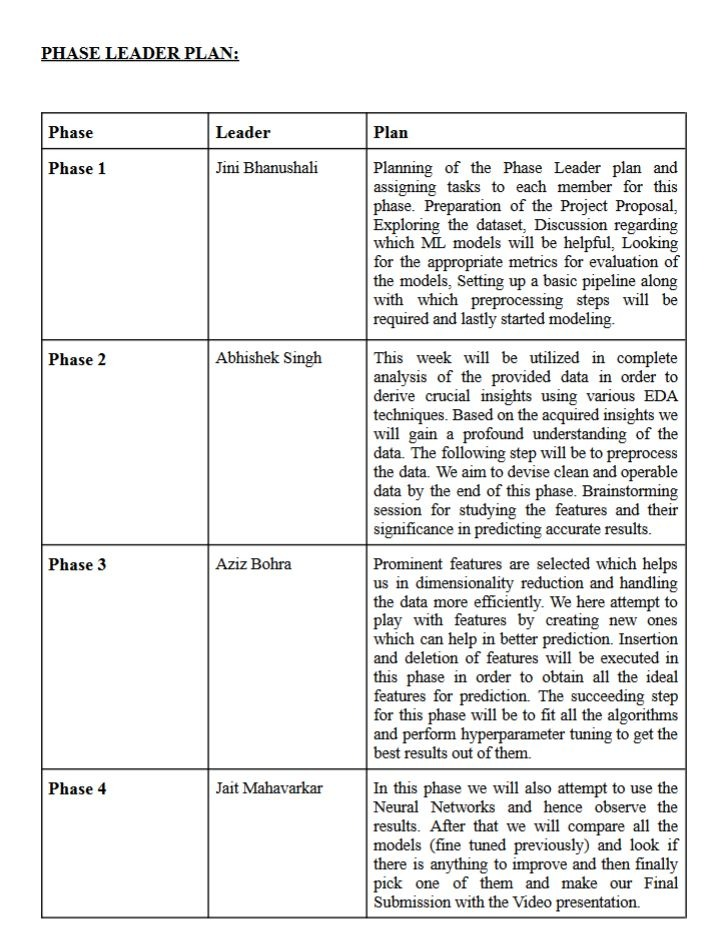

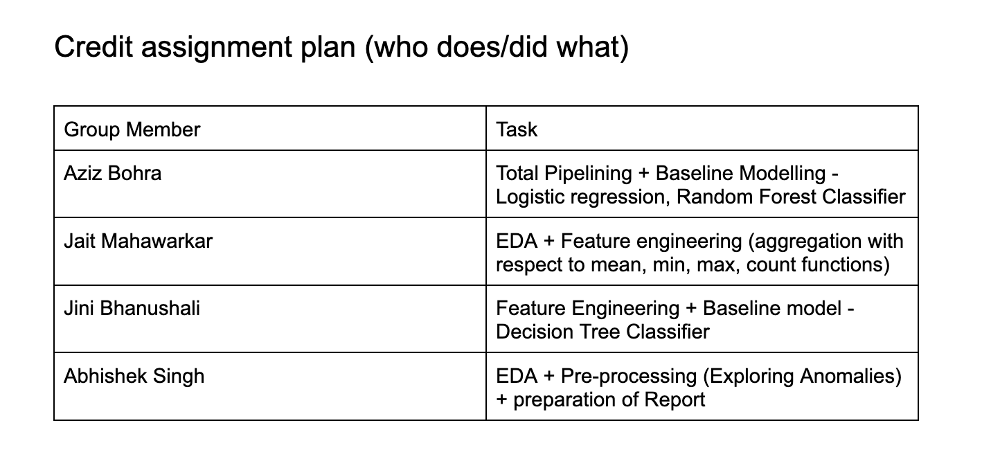


## Abstract
For any financial institution, determining whether the borrower is capable of repayment given a principal, maturity, and schedule is a crucial step in the loan-issuing process. In this phase of our project, we have finally achieved our set goals of building a model that can assist these financial institutes to determine the capability of the borrower to repay the loan based on the past HCDR dataset. 

In the previous stages we started with first exploring the dataset, performing  EDA to derive some useful insights followed by feature engineering using aggregate functions and polynomial features(70 polynomial features). We also developed a single layer Neural Network and multilayer perceptron. Some of the problems we came across were failure of Kernel, delay due to pytorch setup, compatibility issues with libraries etc.The usage of pipelines, Feature Engineering were something crucial with which our models were improved. We did hyperparameter tuning using GridSearchCV which resulted in XGBoost and Random Forest to be models with good AUC score. In the final phase of our project we developed Single Layer NN, Multilayer Perceptron with four hidden layers using Adam as an optimizer and binary cross entropy as loss function. We  also built Multilayer Perceptron using oop API.  In this phase we wrapped up our project declaring XGBoost to be the best model. Our kaggle score improved to 72% (AUC score) with the XGBoost model.The results on the experiments we performed were: Logistic Regression  92.09% Random Forest: 92.20% XGBoost: 92.20% LightGBM: 92.09% SVC: 92.10% SNN: 91.93% MLP: 92.2%

### Tasks for the current Phase

1)Setting up PyTorch.

2)Build a Single Layer Neural Network.

3)Develop Multi Layer Perceptron.

4)Develop Multi Layer Perceptron with OOP API.

5)Submit scores on KAGGLE

## Project Description

The project was divided into 4 phases. Each phase had its crucial contribution to the successful completion of the project. In each phase a certain number of tasks were tackled. In phase 1 our main task was to curate the phase plans and plan the procedure to complete the project in 4 phases. We also went through the dataset provided and understood the meaning of the parameters used in the dataset. We went ahead to create a gant chart to schedule our tasks. In the phase 2 of the project we implemented EDA and Feature engineering with aggregate functions. We also preprocessed the data and built pipeline to handle data leakage.Now we had clean data ready for modeling. In the following phase , Hyperparameter tuning was done using GridSearchCV on XGBoost, Logistic Regression, Random Forest, Light GBM, and SVC. In the final phase of our project we developed Single layer Neural Network and Multilayer Perceptron using oop API. We also submitted our score on kaggle for final evaluation.  The results on the experiments we performed were: Logistic Regression  92.09% Random Forest: 92.20% XGBoost: 92.20% LightGBM: 92.09% SVC: 92.10% MLP: 92.2% In this phase we wrapped up our project declaring XGBoost to be the best model.








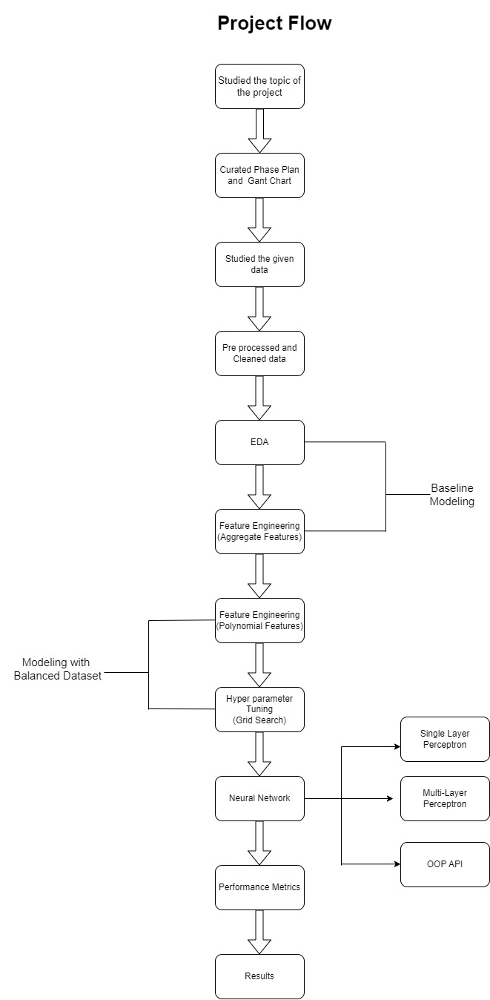

## Data Lineage


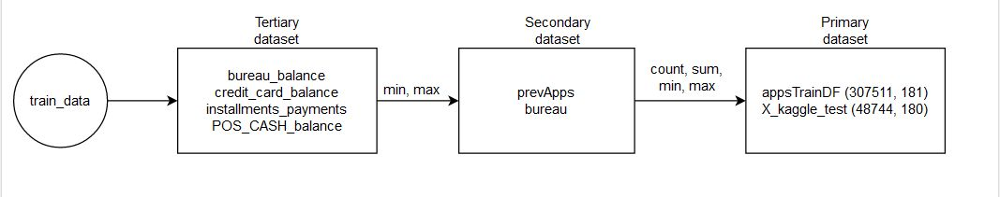

We considered three levels for preparation of the training data. Firstly in the tertiary level we considered bureau_balance, credit_card_balance, installments_payments, POS_CASH_balance which we passed through feature engineering using aggregate functions (min, max). Then in the secondary level we merge the tertiary level and then passed the features prevApps, bureau from the secondary level through aggregate function (count, sum, min, max). And then finally merging with the primary level features appsTrainDF and X_kaggle_test.

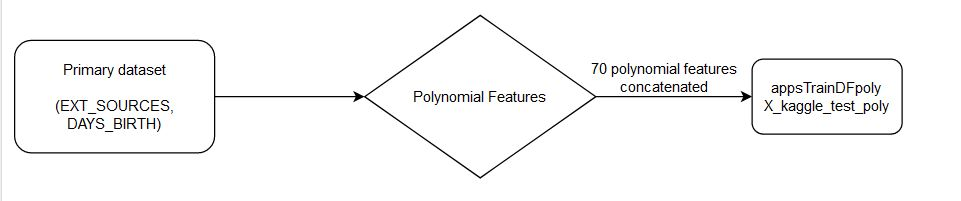

From the primary level we selected EXT_SOURCEs and DAYS_BIRTH and then used Polynomial Features. Hence we got 70 new polynomial features.

This features were concatenated with the primary level. Hence the dataset is now ready for modeling

## Feature Engineering and transformers
Phase 2

After preprocessing the data, we moved to feature engineering. For Phase 2, we found the correlated numerical features between all the datasets and target using mean, min, max, sum and count aggregate function. Then there were many missing numerical values in all the dataset so using SimpleImputer we replaced them by ‘mean’ of that particular column. And same for the categorical data, they were replaced by ‘most frequent words’ in that column.

Phase 3

GridSearchCV on XGBoost, Logistic Regression, Random Forest, Light GBM, and SVC were used to hyper parameter tune each model, and the accuracies of the adjusted models were compared to the test data to make a comparison. We used polynomial features using EXT_SOURCE 1/2/3 and DAYS_BIRTH. Using polynomial features with EXT_SOURCE will create additional features that contain combinations of the original EXT_SOURCE values. For example, if EXT_SOURCE is a 3-dimensional vector, polynomial features would create additional features that contain combinations of the original EXT_SOURCE values, such as EXT_SOURCE^2, EXT_SOURCE^3, EXT_SOURCE^2*EXT_SOURCE_2, and so on. These new features can then be used in a predictive model to help improve its accuracy.

New Features added are:

Feature 1 - (Ext_Source_1 + Ext_Source_2 + Ext_Source_3)/Amt_Receivable We took the ratio of Sum of External Sources of Income divided by Amt Receivable as a Feature.

Feature 2 - Ext_Source_1 + Ext_Source_2 + Ext_Source_3 We took the Sum of External Sources of Income of Customer as a Feature.

Feature 3 - Ext_Source_1 Ext_Source_2 Ext_Source_3 We took the Multiplication of External Sources of Income of Customer as a Feature.

Feature 4 - Ext_Source_12 + Ext_Source_23 + Ext_Source_34 We took the Weighted Sum of External Sources of Income of Customer as a Feature.

Feature 5 - Max of (Ext_Source_1, Ext_Source_2, Ext_Source_3) We took the Maximum of External Sources of Income of Customer as a Feature. The team members' idea-generating sessions served as the basis for the selection of each of these features. Following the addition of the aforementioned characteristics, we correlated all other features with the goal variable and only kept features that had a correlation with the target variable of more than 5%.

In this method, we make features that are powers of existing features as well as interaction terms between existing features. For example, we can create variables EXT_SOURCE_1^2 and EXT_SOURCE_2^2 and also variables such as EXT_SOURCE_1 x EXT_SOURCE_2, EXT_SOURCE_1 x EXT_SOURCE_2^2, EXT_SOURCE_1^2 x EXT_SOURCE_2^2, and so on. These features that are a combination of multiple individual variables are called interaction terms because they capture the interactions between variables. In other words, while two variables by themselves may not have a strong influence on the target, combining them together into a single interaction variable might show a relationship with the target. Interaction terms are commonly used in statistical models to capture the effects of multiple variables.
We also considered datasets in three different segments as Primary, Secondary and Tertiary and then merged at the end before training. 


## Hyperparameter Tuning

We used GridSearch for hyper-paramter tuning on all the classifiers. Before conducting we passed 'param_grid' which consisted some arbitrary values and most commonly used values for those specific parameters. And 'param-grid' consisted values for all classifiers. After conducting grid search we found XGBoost to be model with highest accuracy followed by Random Forest


XGBoost

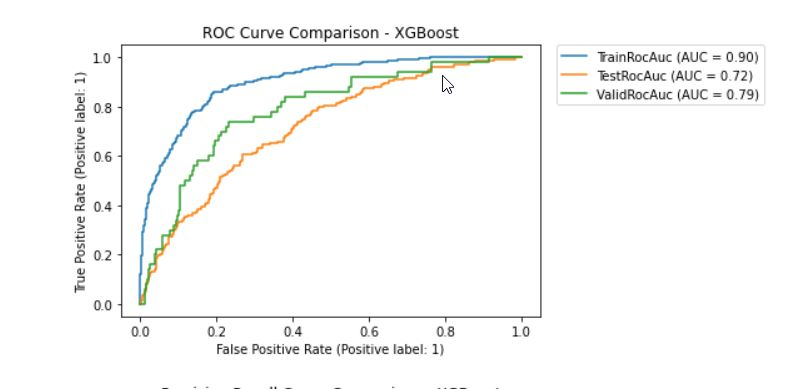

Best Parameters:

	predictor__colsample_bytree: 0.5
	predictor__eta: 0.01
	predictor__learning_rate: 0.01
	predictor__max_depth: 3
	predictor__n_estimators: 500

Random Forest

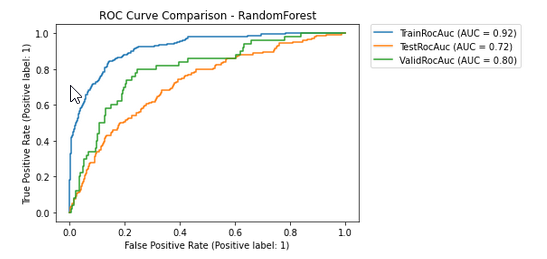

Best Parameters:

	predictor__bootstrap: True
	predictor__max_depth: 5
	predictor__max_features: 20
	predictor__min_samples_leaf: 3
	predictor__min_samples_split: 5
	predictor__n_estimators: 1000

## Pipelines
Pipeline is created to prevent leakage and loss of data over the entire process.
Here we have created a pipeline data_prep which further gas two pipelines cat and num.

num_pipeline: This pipeline consists of 3 steps (for Numerical Data)

    Selector : Selecting numerical data from the dataset
    Imputer: The numerical null values are replaced by the mean of the column.
    Std_Scaler: All the numerical values are scaled to equivalent scale for better computation.

cat_pipeline: This pipeline consists of 3 steps (for Categorical Data)

    Selector: Selecting categorical data from the dataset
    Imputer: The categorical null values are replaced by the most frequently occurring values.
    One hot Encoder: Encodes data into binary notation.


This way both the pipelines are appended into one.

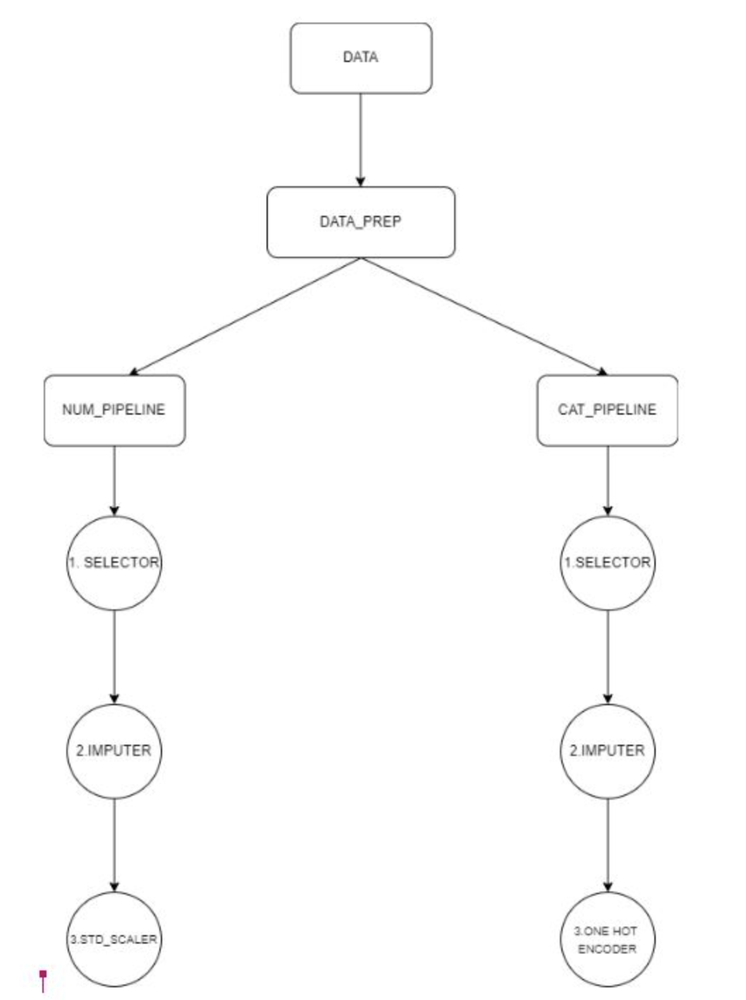


Further on, for every model we have created a predictor pipeline. This is the most important pipeline of our project. This predictor pipeline consists of data_prep_pipeline which we had created above and baseline model.

Family of features: EXT_SOURCE_3, EXT_SOURCE_2, EXT_SOURCE_1 (Polynomial features), AMT_ANNUITY, AMT_CREDIT(mean, max, sum, count)

Number of Input Features: 166

### MSE Loss Equation

A regression line's fit to a set of data points is gauged using the Mean Squared Error.
The expected value of the squared error loss is represented by a risk function.

By determining the average—more particularly, the mean—of mistakes squared from data related to a function, the mean square error is determined. 


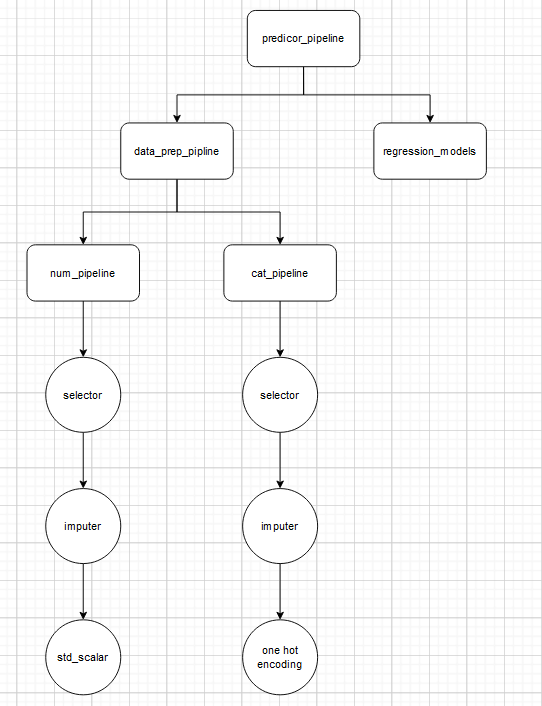

## Binary cross-entropy loss (CXE)
CXE measures the performance of a classification model whose output is a probability value between 0 and 1. CXE increases as the predicted probability diverges from the actual label. Therefore, we choose a parameter, which would minimize the binary CXE loss function.

The log loss formula for the binary case is as follows :
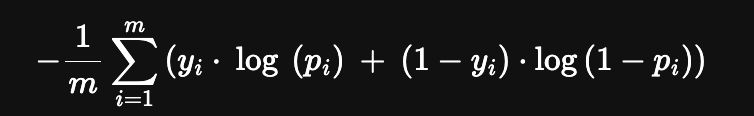
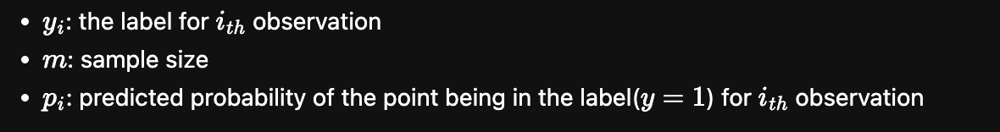

## Data Leakage

Data leakage (or leaking) happens when a data collection contains pertinent data but equivalent data is not available when the models are used to make predictions. This yields excellent performance on the training dataset (and perhaps even the validation accuracy), but poor production performance.

When a data collection has pertinent information but equivalent information is not available when the models are used to make predictions, data leakage occurs.

Since we have previously handled with all the missing values and have consistently established the data types throughout the datasets, we can observe that there is no data leakage for the pipelines that we have used. Additionally, we have made sure that the recently introduced features have been properly used during training and are accessible during testing.

### Cardinal Sins

1)No train-test split: Overfitting results from this. The data has been divided into train and test groups.

2)Faulty data: Due to duplication and missing information, the data does not accurately reflect the situation. However, issue is resolved by removing columns with a large number of missing values or by suitably substituting mean/median for those columns.

3)Without fully analyzing the outcomes It may be incorrect to use accuracy score as the only metric. It is even more deceptive in this instance if there is an imbalance. Other measures that we have used include the confusion matrix, ROC-AUC score, and CXE loss.

4)Increasing the number of epochs mindlessly: Since the loss epoch graph converges, as seen in the tensorboard, the number of epochs was increased in order to improve accuracy.



## BaseLine Model

In this phase we experimented with Logistic Regression. In these experiments we used 30% of the data to implement these models. For the Logistic regression model , we achieved an accuracy of 91.91% whereas the AUC accuracy was 73.64%. This time the Baseline model was fitted on the balanced dataset and didnt overfit. On the other hand it yeilded a good test accuracy and AUC score.

Also we have used polynomial features using the correlation we found in the previous phase while exploratory data analysis. And following this we started hyperparameter tuning and fitted Logistic Regression as well as other models which are mentioned and studied their results and drew conclusions and insights which we will be needing for the final phase.

## Neural Networks (Multi Layer Perceptron)

A multilayer perceptron (MLP) is a fully connected class of feedforward artificial neural network (ANN). The term MLP is used ambiguously, sometimes loosely to mean any feedforward ANN, sometimes strictly to refer to networks composed of multiple layers of perceptrons (with threshold activation); see § Terminology. Multilayer perceptrons are sometimes colloquially referred to as "vanilla" neural networks, especially when they have a single hidden layer.
An MLP consists of at least three layers of nodes: an input layer, a hidden layer and an output layer. Except for the input nodes, each node is a neuron that uses a nonlinear activation function. MLP utilizes a supervised learning technique called backpropagation for training. Its multiple layers and non-linear activation distinguish MLP from a linear perceptron. It can distinguish data that is not linearly separable.

### Adam Optimizer 

Adaptive Moment Estimation is an algorithm for optimization technique for gradient descent. The method is really efficient when working with large problem involving a lot of data or parameters. It requires less memory and is efficient. 
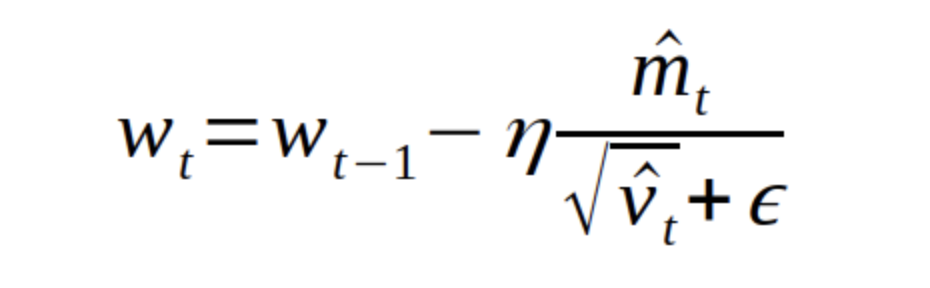

Where w is model weights, eta (look like the letter n) is the step size (it can depend on iteration). And that’s it, that’s the update rule for Adam.




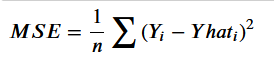

#### Layer Architecture

MLP

166-ReLU-100-90-80-70-1-Sigmoid 
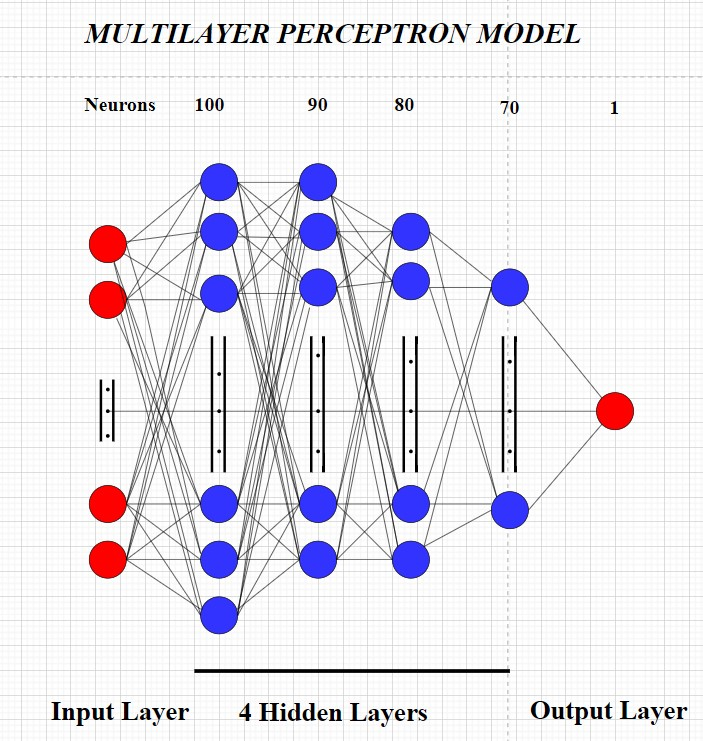



MLP using OOP API

166-LeakyReLU-100-LeakyReLU-75-LeakyReLU-55-LeakyReLU-35-LeakyReLU-15-LeakyReLU-2-Softmax
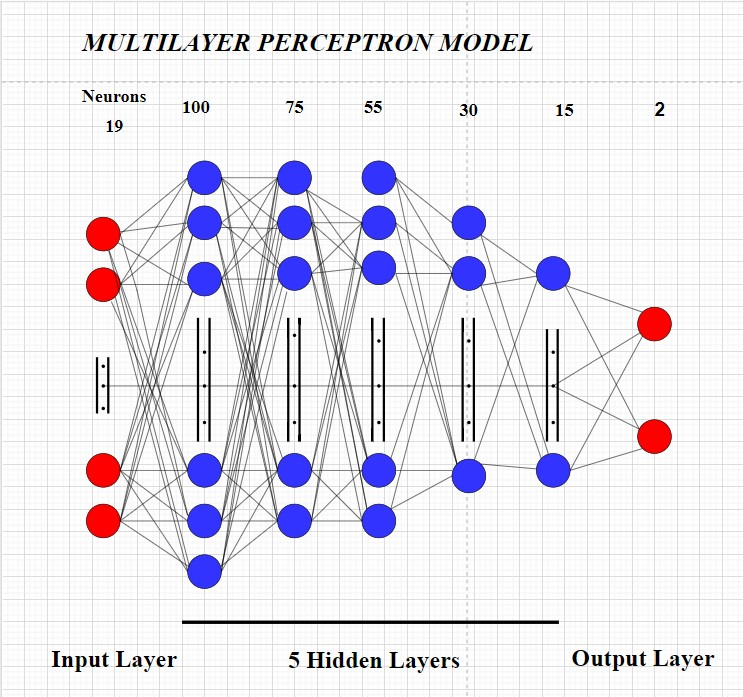


## Experimental results

### Phase 2 results

In phase 2 we built basic models with feature engineering using aggregate function only and the results shown are based on the tests conducted on the imbalanced dataset. Here, Baseline Logistic Regression overfitted. Random Forest and XGBoost done fine, however results aren't certain due to the imbalanced dataset.


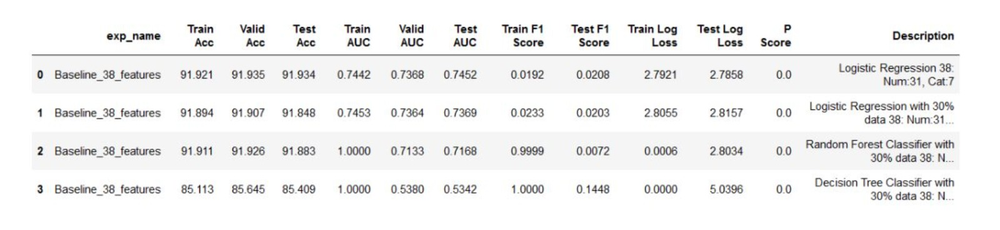


### Phase 3 results

In the next phase we also tried different classifier models and comprehended the scores yielded by the same. 


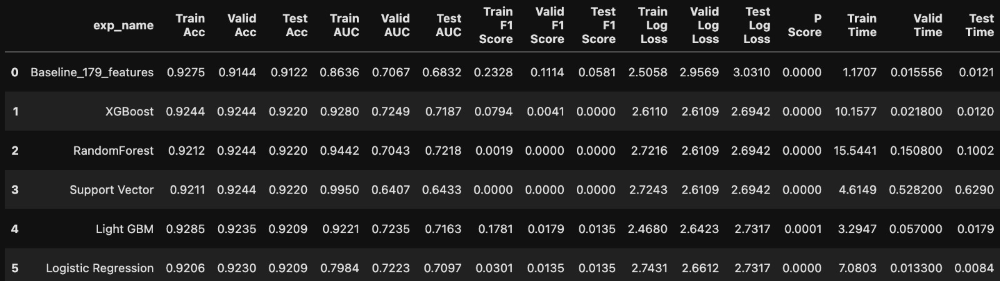

The above results are generated after conduction of grid search and best parameters are selected and on those parameters the given models are fitted. From the results, we deduce that XGBoost, Random Forest are the leading models in this phase with 92% test accuracy and a good test AUC of 71~72%. We obtained these results using 180 features which consists of 70 polynomial features and other aggregated features. Although, the Logistic Regression has overfitted since its test accuracy is greater than its training accuracy. All these models were fitted on the BALANCED dataset unlike the last Phase where we tested on the imbalanced dataset.



### Final Phase result
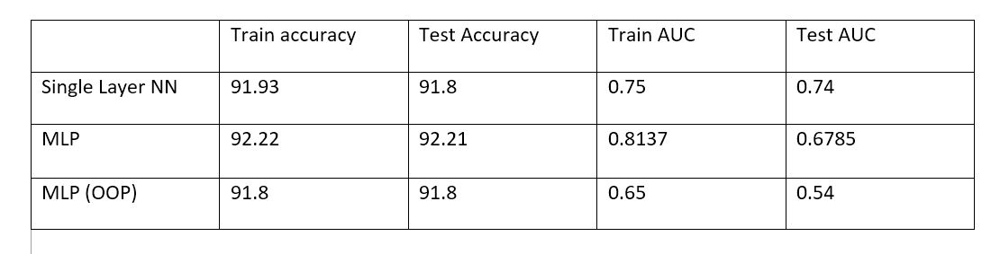

In this phase we used deep learning and incorporated Neural Networks to assist in the given classification problem. Single Layer NN yielded and MLP yielded good AUC scores of around 0.7 where we used BCE Loss. On the other hand, we tried to achieve the stretch goal of this phase by building MLP with the OOP API where we considered CrossEntropy Loss since we had two output neurons and a softmax activation function. MLP (OOP) yielded an AUC score of 0.6.

## Issues faced in Phase 4

1) Setting up PyTorch caused a large amount of delay in the progress of the project. 

2) Had multiple issues with the existing libraries’ version and their compatibility with other libraries

3) Could not configure PyTorch to use MAC GPU. Hence, the training time was considerably increased.

4) TensorBoard didn’t work on Jupyter Notebook.


## Discussion
For this phase XGBoost, Random Forest and MLP were the best model which provided a test accuracy of 92.20% and kaggle accuracy of 72%. As mentioned in the previous phase we did feature engineering using polynomial features on EXT_SOURCES and DAYS_BIRTH since these features were highly correlated. There is a very good scope of improving the MLP model by tweaking the number of neurons in the hidden layers and number of hidden layers (sufficiently large number of neurons). And, ML models like XGBoost, LightGBM and Random Forest could also be improved by passing more parameter value in GridSearch.


## Conclusion

For any financial institution, determining whether the borrower is capable of repayment given a principal, maturity, and schedule is a crucial step in the loan-issuing process. In this project, we have developed a machine learning model that can predict behavior and repayment capacity based on a variety of specified parameters. Checking the capability of a client to repay the loan is of utmost importance to any financial institution in order.

We hypothesized that AMT_ANNUITY and AMT_CREDIT would be the features that would be aggregated, and features like EXT_SOURCES and DAYS_BIRTH were used for polynomial feature engineering. We developed several pipelines: numerical for scaling and dealing with missing values, categorical for imputing and one-hot encoding, and data prep for preparing the whole dataset before modeling. The full predictor pipeline comprised of data prep and the model. The best features we identified were EXT_SOURCE1, EXT_SOURCE2, EXT_SOURCE3, and DAYS_BIRTH. These were considered and developed into polynomial features. The best model was considered to be XGBoost.

## Gap Analysis

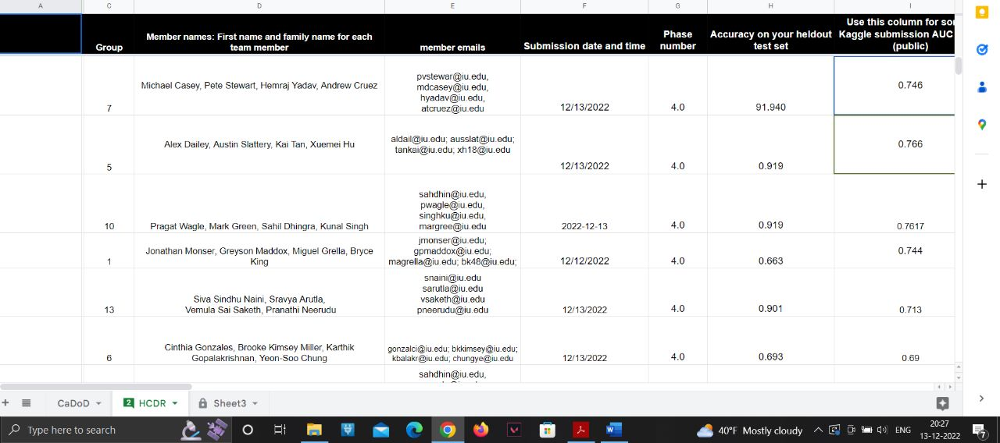

Gap analysis
1)	Compared to Group with highest AUC score (Groups 5,1) has an architecture of MLP which comprises of 4 hidden layers with a greater number of neurons. This is where we observed a gap because as compared to this architecture, we have 4 hidden layers but with very a smaller number of neurons. Due to this factor, our model might have encountered weak learning in the training phase.

2)  FLAG_DOCUMENT_3 , REG_CITY_NOT_LIVE_CITY, FLAG_EMP_PHONE, REG_CITY_NOT_WORK_CITY, DAYS_ID_PUBLISH --> the immportant features considered by group 7 who have their best model as Logistic Regression are totally different from ours. More extensive EDA regarding these features might help to bridge the gap between the scores of both the groups.

2)	Some of the important features considered by other groups weren’t identical to ours. The interpretation of the result by both the groups might the reason for identifying different features. The difference in the features selected might be one of the reasons for achieving different accuracies.

3)	With different features followed different approaches to obtain the desired output and hence, resulted in contrasting accuracies.


## Kaggle Submission
The Kaggle Submissions for this problem are evaluated on area under the ROC curve (AuROC) between the predicted probability and the observed target. And keeping this in mind we evaluated our models on the same metric and submitted the required csv file.
Our score on Kaggle is improved during this phase and we intend to improve more in the last and the final phase of the project. We aim to improve XGBoost and perform hyperparameter tuning on the Multi Layer Perceptron to be more robust and yeild better resutls.

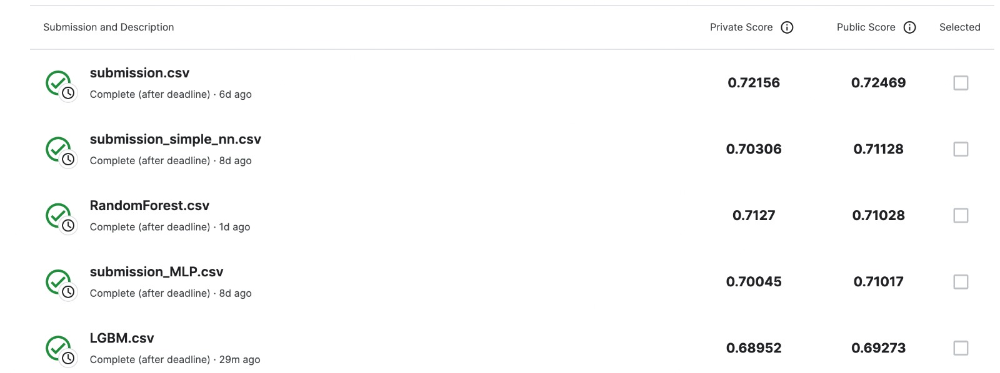

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


https://datavizpyr.com/visualizing-missing-data-with-seaborn-heatmap-and-displot/

https://www.kaggle.com/c/home-credit-default-risk/data

https://www.kaggle.com/competitions/home-credit-default-risk/code

https://scikit-learn.org/stable/supervised_learning.html#supervised-learning

https://www.projectpro.io/recipes/use-xgboost-classifier-and-regressor-in-python

https://pytorch.org/get-started/pytorch-2.0/

https://pytorch.org/tutorials/beginner/basics/buildmodel_tutorial.html

https://gist.github.com/Joelfranklin96/2adb0472b1aba6f83f26493b47e0b18a

https://www.udacity.com/course/deep-learning-pytorch--ud188

https://www.javatpoint.com/feature-engineering-for-machine-learning

https://www.analyticsvidhya.com/blog/2021/04/evaluating-machine-learning-models-hyperparameter-tuning/

https://www.kaggle.com/code/manojmavatkar/linear-regression-using-polynomial-features

https://machinelearningmastery.com/implement-backpropagation-algorithm-scratch-python/

https://keras.io/examples/vision/mlp_image_classification/



#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/